__Import Libraries__

In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from pylab import rcParams
import pywt
from skimage import exposure
from skimage.metrics import structural_similarity as ssim
import torch
import torch.nn.functional as F
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd
import scipy
import os
from matplotlib.gridspec import GridSpec
import string
import matplotlib.ticker as ticker

In [3]:
DH = 10.
NX = 450
NY = 180
vpmin = 800.0

FSize = 15
font = {'color':  'black',
        'weight': 'normal',
        'size': FSize}
mpl.rc('xtick', labelsize=FSize) 
mpl.rc('ytick', labelsize=FSize) 
rcParams['figure.figsize'] = 20, 10

def read_model(file_path, NX, NY):
    with open(file_path, "rb") as f:
        data_type = np.dtype("<f4")
        data = np.fromfile(f, dtype=data_type).reshape(NX, NY).T[::-1] #.T[::-1] is to transpose and flip the array
    return data

def calculate_metrics(image_gt, image_prd):
    metrics = {}

    # Structural Similarity Index (SSIM)
    metrics['ssim_index'] = ssim(image_gt, image_prd)

    # Frobenius norm
    metrics['frobenius_norm'] = np.linalg.norm(image_gt - image_prd, 'fro')
    # L1 norm
    metrics['l1_norm_value'] = np.sum(np.abs(image_gt - image_prd))
    # L2 norm
    metrics['l2_norm_value'] = np.sqrt(np.sum((image_gt - image_prd) ** 2))
    # MSE
    metrics['mse'] = np.mean((image_gt - image_prd) ** 2)
    # RMSE
    metrics['rmse'] = np.sqrt(metrics['mse'])

    return metrics

basename = "/Users/ahmedahmed/Documents/07_Test/DENISE/007_BP_TTI/par/start/BP/BP_true2.vp"
name_vp = basename    # Baseline model (smoothed)
vp = read_model(name_vp, NX, NY)
vp = np.flipud(vp)

print("vp min:", vp.min(), "vp max:", vp.max())
print("vp shape:", vp.shape)

vp min: 1492.0 vp max: 4552.4766
vp shape: (180, 450)


vp min: 1492.0 vp max: 4552.4766
vp shape: (180, 450)

In [4]:
## kernel 5x5 matrix
kernel = np.array([[1, 1, 1, 1, 1],
                    [1, 2, 2, 2, 1],
                    [1, 2, 4, 2, 1],
                    [1, 2, 2, 2, 1],
                    [1, 1, 1, 1, 1]], dtype=float)


# Normalize the kernel so that the sum is 1
kernel /= kernel.sum()

slowness = 1 / np.square(vp)
smoothed_slowness = scipy.signal.convolve2d(slowness, kernel, mode='same', boundary='symm')
vp_smth3x3 = 1 / np.sqrt(smoothed_slowness)

vp = vp_smth3x3.copy()

In [5]:
vp_upsamp512x512 = F.interpolate(torch.tensor(vp, dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(512, 512), mode='nearest-exact').squeeze().numpy()
vp_upsamp512x512_downsamp180x450 = (F.interpolate(torch.tensor(vp_upsamp512x512, dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())

####### differences
diff_orig_downsamp = vp - vp_upsamp512x512_downsamp180x450

print("vp upsamp min:", vp_upsamp512x512.min(), "vp upsamp max:", vp_upsamp512x512.max())
print("vp upsamp downsampled min:", vp_upsamp512x512_downsamp180x450.min(), "vp upsamp downsampled max:", vp_upsamp512x512_downsamp180x450.max())
print("diff_orig_downsamp min:", diff_orig_downsamp.min(), "diff_orig_downsamp max:", diff_orig_downsamp.max())

vp upsamp min: 1492.0 vp upsamp max: 4525.225
vp upsamp downsampled min: 1492.0 vp upsamp downsampled max: 4525.225
diff_orig_downsamp min: -0.00024410387413809076 diff_orig_downsamp max: 0.00024412207039858913


vp upsamp min: 1492.0 vp upsamp max: 4525.225
vp upsamp downsampled min: 1492.0 vp upsamp downsampled max: 4525.225
diff_orig_downsamp min: -0.00024410387413809076 diff_orig_downsamp max: 0.00024412207039858913

In [6]:
def scale_data(data):
    min_val, max_val = data.min(), data.max()
    scaled = (data - min_val) / (max_val - min_val)
    return scaled, min_val, max_val

# Function to rescale data back to original range
def rescale_data(data, min_val, max_val):
    return data * (max_val - min_val) + min_val

def normalize_to_unit_range(data):
    if data.min() == data.max():
        # If all values are the same, return a constant array
        return np.zeros_like(data)  # Or np.ones_like(data), depending on preference
    return (data - data.min()) / (data.max() - data.min())

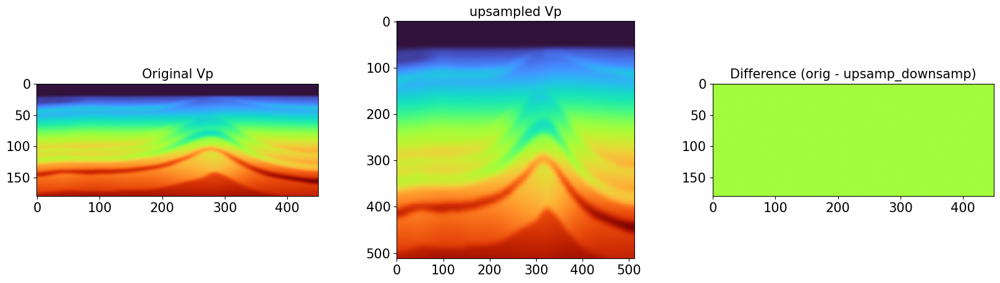

In [6]:
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
plt.imshow(vp, cmap='turbo')
plt.title('Original Vp', fontdict=font)

plt.subplot(1,3,2)
plt.imshow(vp_upsamp512x512, cmap='turbo')
plt.title('upsampled Vp', fontdict=font)

plt.subplot(1,3,3)
plt.imshow(diff_orig_downsamp, cmap='turbo', vmax=1, vmin=-1)
plt.title('Difference (orig - upsamp_downsamp)', fontdict=font)
plt.show()  

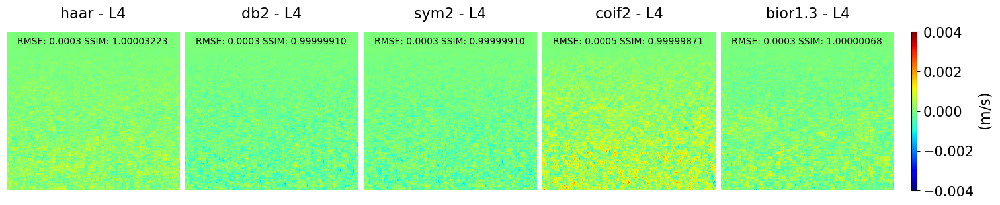

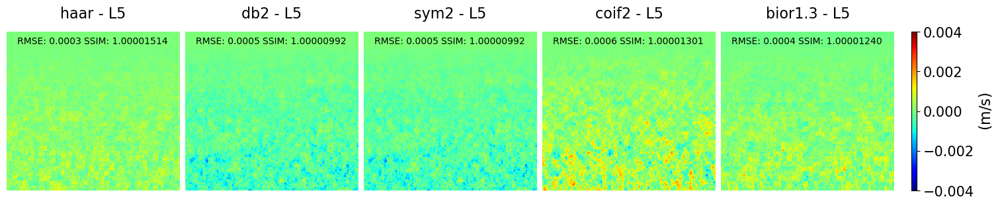

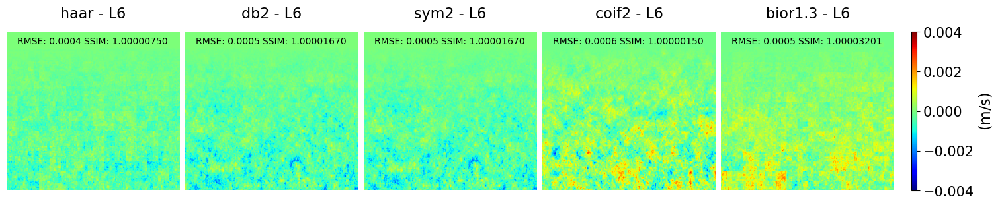

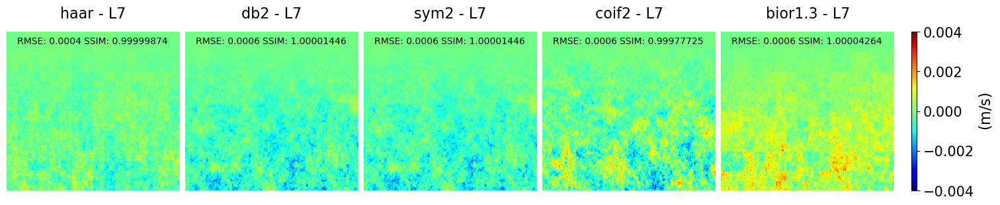

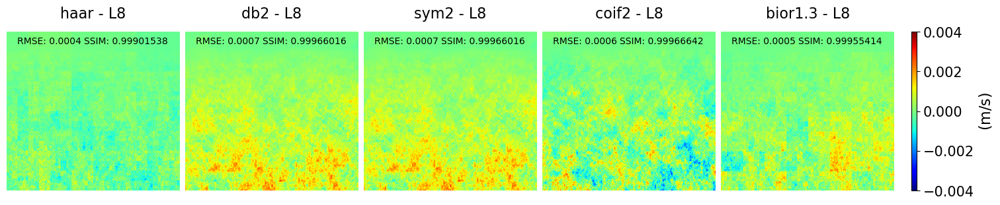

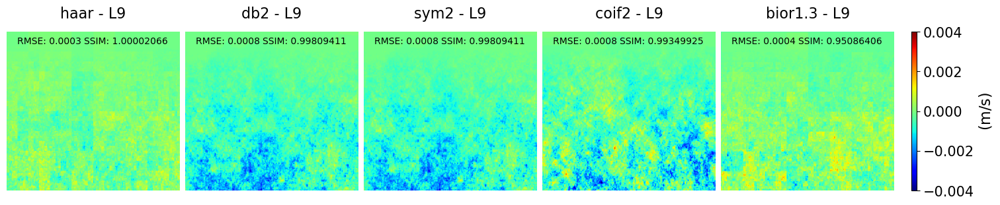

In [8]:
scaled_data, original_min, original_max = scale_data(vp_upsamp512x512)

n = vp_upsamp512x512.shape[0]

wavelet_types = ['haar', 'db2', 'sym2', 'coif2', 'bior1.3']

reconstruct_images_IP512 = {wavelet: {} for wavelet in wavelet_types}
differences = {wavelet: {} for wavelet in wavelet_types}
metrics_maxL_test = {wavelet: {} for wavelet in wavelet_types}

for i in range(4, 10):

    for wavelet in wavelet_types:
        ## This can be used in case we want to calculate the max level according to the data length and used wavelet transform
        # max_level = pywt.dwt_max_level(data_len=n, filter_len=pywt.Wavelet(wavelet).dec_len)  
        # print("max_level: ", max_level)

        max_level = i

        # Initialize storage for each max_level
        if max_level not in reconstruct_images_IP512[wavelet]:
            reconstruct_images_IP512[wavelet][max_level] = {
                'accumulative_levels': [],
                'final_reconstruction': None
            }

        coeffs = pywt.wavedec2(scaled_data, wavelet=wavelet, level=max_level, mode='symmetric')

        # Partial reconstruction for each level
        reconstructed_accumulative = []


        for j in range(0, max_level + 1):
            
            # Retain only coefficients up to level `j`
            coeffs_temp = [coeffs[0]] + coeffs[1:j+1] #+ [(None, None, None)] * (max_level - j)            
            
            # Reconstruct the image
            A = pywt.waverec2(coeffs_temp, wavelet=wavelet, mode='symmetric')
            A_normalized = normalize_to_unit_range(A)
            A_nonNormalized = rescale_data(A_normalized, original_min, original_max)

            # Append the accumulative reconstructed image
            reconstructed_accumulative.append(A_nonNormalized)

        # Store the results for the current max_level
        reconstruct_images_IP512[wavelet][max_level]['accumulative_levels'] = reconstructed_accumulative
        reconstruct_images_IP512[wavelet][max_level]['final_reconstruction'] = reconstructed_accumulative[-1]

        # Calculate differences only for the final level reconstruction
        final_reconstruction = reconstructed_accumulative[-1]
        if wavelet not in differences:
            differences[wavelet] = {}
        differences[wavelet][max_level] = vp_upsamp512x512 - final_reconstruction
        #### calculute RMSE values
        metrics_maxL_test[wavelet][max_level] = calculate_metrics(vp_upsamp512x512, final_reconstruction)
    ###########################################################################################
    fig, axes = plt.subplots(1, 5, figsize=(15, 3), constrained_layout=True)

    # Define color range for differences based on symmetric mode (if exists)
    if max_level == 7:
        differences_symm_haar_oldWay = differences['haar'][max_level]  # Using Haar symmetric as reference
        vmax2 = np.percentile(np.abs(differences_symm_haar_oldWay), 100.0)
        vmin2 = -vmax2

    # Plot differences for each padding mode
    for i, wt in enumerate(wavelet_types):
        ax = axes.flat[i]
        # im = ax.imshow(differences[wt][max_level], cmap='jet', aspect='auto', vmin=-0.006, vmax=0.006)
        im = ax.imshow(differences[wt][max_level], cmap='jet', aspect='auto', vmin=-0.004, vmax=0.004)
        ax.set_title(f'{wt} - L{max_level}', fontsize=16, pad=15)
        ax.axis('off')
        ax.text(0.43, 0.94, f"RMSE: {metrics_maxL_test[wt][max_level]['rmse']:.4f}", fontsize=10, ha='right', va='center', transform=ax.transAxes)
        ax.text(0.93, 0.94, f"SSIM: {metrics_maxL_test[wt][max_level]['ssim_index']:.8f}", fontsize=10, ha='right', va='center', transform=ax.transAxes)
    
    cbar3 = plt.colorbar(im,  pad=0.1, aspect=30)
    cbar3.set_label(r"($\mathrm{m/s}$)", fontsize=16)

    # Add a single colorbar for all subplots
    # fig.colorbar(im, ax=axes.ravel().tolist(), location='right', shrink=0.9)
    # plt.savefig(f'./plots/Test_Max_LevelDecompositions_diff_IP512x512_5Wavelets_Lmax{max_level}_ImageRec512x512_RMSEcalc.png', dpi=300, bbox_inches='tight')

    plt.show()
    # plt.close()

### Replotted for paper

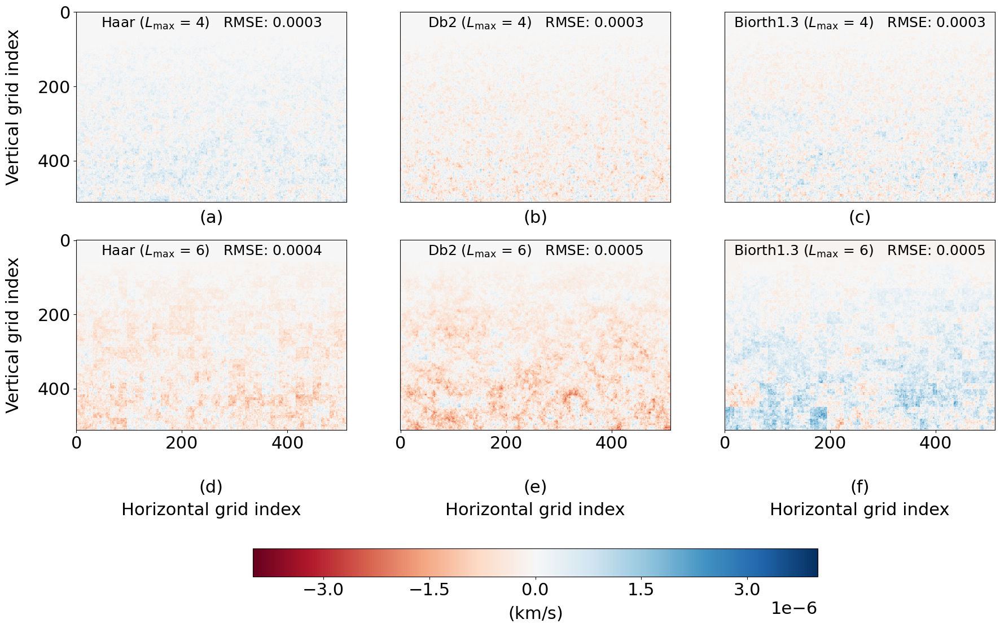

In [134]:
wavelet_type_4plotting = ['haar', 'db2', 'bior1.3']
wavelet_display_names = {
    'haar': 'Haar',
    'db2': 'Db2',
    'bior1.3': 'Biorth1.3'
}
max_levels_4plotting = [4, 6]

# Remove `constrained_layout=True` to avoid conflict
fig, axes = plt.subplots(len(max_levels_4plotting), len(wavelet_type_4plotting), 
                         figsize=(21, 13), gridspec_kw={'hspace': 0.2, 'wspace': 0.2})

# Generate alphabetic labels (A, B, C, ...)
labels = list(string.ascii_lowercase)
label_fontsize = 22  # Increased font size for clarity

xlabel_txt = 'Horizontal grid index'
ylabel_txt = 'Vertical grid index'

letter_offset = -0.12      # how far below the image (axes fraction)
labelpad_bottom = 35       # space between image and bottom X-label

for row_idx, max_level in enumerate(max_levels_4plotting):
    for col_idx, wt in enumerate(wavelet_type_4plotting):
        ax = axes[row_idx, col_idx]
        im = ax.imshow(differences[wt][max_level] / 1000.0, cmap='RdBu', 
                       aspect='auto', vmin=-0.004/1000.0, vmax=0.004/1000.0)
        
        # 1) your little subplot letter
        label_idx = row_idx * len(wavelet_type_4plotting) + col_idx
        # for bottom row, we’ll do a multiline xlabel…
        if row_idx == len(max_levels_4plotting) - 1:
            ax.set_xlabel(
                f'({labels[label_idx]})\n{xlabel_txt}',
                fontsize=label_fontsize,
                labelpad=labelpad_bottom,
                linespacing=1.5
            )
            ax.tick_params(labelsize=22)
        else:
            ax.set_xlabel(f'({labels[label_idx]})', fontsize=label_fontsize, labelpad=10)
            ax.set_xticks([])

        # 2) y-ticks only for first column, plus a ylabel there
        if col_idx == 0:
            ax.set_ylabel(ylabel_txt, fontsize=22, labelpad=20)
            ax.tick_params(labelsize=22)
        else:
            ax.set_yticks([])

        # ax.text(0.67, 0.94, f"RMSE: {metrics_maxL_test[wt][max_level]['rmse']:.4f}", fontsize=16, ha='right', va='center', transform=ax.transAxes)
        ax.text(0.5, 0.94, fr"{wavelet_display_names[wt]} ($L_{{\max}}$ = {max_level})   RMSE: {metrics_maxL_test[wt][max_level]['rmse']:.4f}", fontsize=18, ha='center', va='center', transform=ax.transAxes)


# **First apply tight_layout(), then adjust the bottom margin**

# **Use automatic colorbar placement**
cbar = fig.colorbar(im, ax=axes, orientation='horizontal', fraction=0.05, pad=0.08)
cbar.ax.tick_params(labelsize=22)  # Large colorbar tick labels
cbar.set_label(r"($\mathrm{km/s}$)", fontsize=22, labelpad=8)

# **Ensure good spacing of colorbar ticks**
cbar.locator = ticker.MaxNLocator(nbins=6)
cbar.update_ticks()
# Increase font size of the offset text (e.g., "1e-6")
cbar.ax.xaxis.offsetText.set_fontsize(22)  # or any desired fontsize

# fig.tight_layout()
fig.subplots_adjust(bottom=0.31)  # Push colorbar lower
plt.savefig(f'./plots/BP_Test_Max_LevelDecompositions_diff_IP512x512_5Wavelets_Lmax4_and_Lmax6_ImageRec512x512_RMSEcalc_4paper_withLabels.png', dpi=300, bbox_inches='tight')
plt.show()


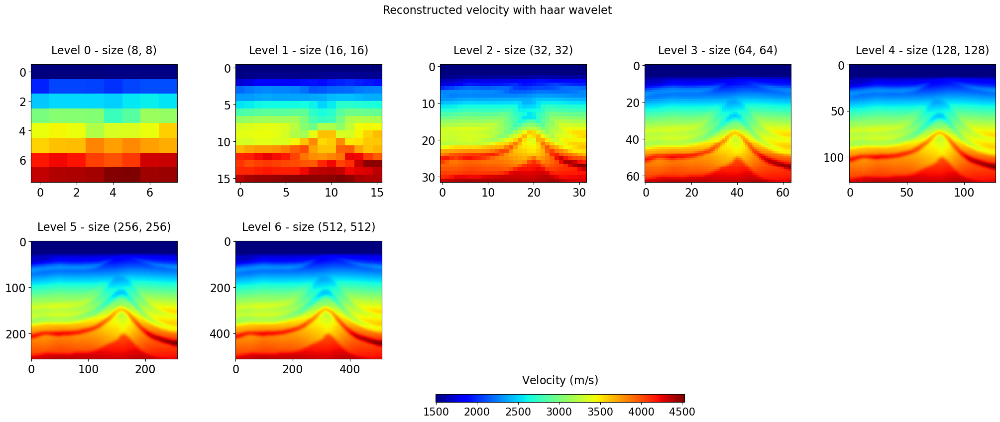

In [23]:
max_level_to_plot = 6
wavelet = 'haar'

fig, axes = plt.subplots(2, 5, figsize=(25, 8), gridspec_kw={'hspace': 0.5, 'wspace': 0.4})
fig.subplots_adjust(hspace=0.55, top=0.85)  # Adjust top for title placement

# Collect the images for consistent color scaling
all_images = [
    reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    for i in range(max_level_to_plot + 1)
]
vmin = min(img.min() for img in all_images)
vmax = max(img.max() for img in all_images)

# Plot each reconstruction level
for i in range(max_level_to_plot + 1):
    ax = axes.flat[i]
    img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    im = ax.imshow(img, cmap='jet', aspect='auto', vmin=vmin, vmax=vmax)
    ax.set_title( f'Level {i} - size ({img.shape[0]}, {img.shape[1]})', pad=15, fontsize=16)
    ax.tick_params(axis='x', labelsize=16)
    ax.tick_params(axis='y', labelsize=16)

# Remove unused axes
for i in range(max_level_to_plot + 1, len(axes.flat)):
    fig.delaxes(axes.flat[i])

# Add colorbar outside the plots
cbar_ax = fig.add_axes([0.45, 0.001, 0.2, 0.02])  # [left, bottom, width, height]
fig.colorbar(im, cax=cbar_ax, orientation='horizontal', shrink=0.1)
cbar_ax.set_title(r"Velocity ($\mathrm{m/s}$)", fontsize=16, pad=15)

# Add main title
fig.suptitle(f'Reconstructed velocity with {wavelet} wavelet', fontsize=16, y=1)
plt.show()

### Replottted for paper

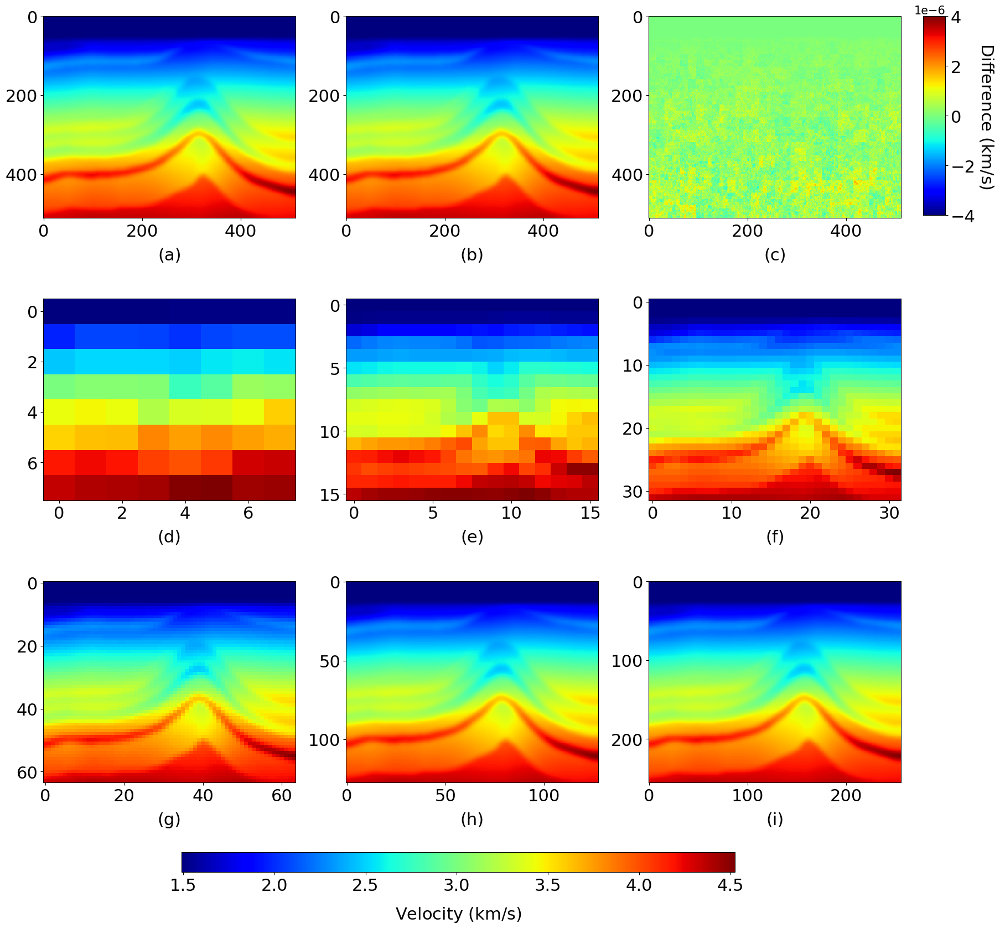

In [16]:
max_level_to_plot = 6
wavelet = 'haar'

# Collect the images for consistent color scaling
all_images = [
    reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    for i in range(max_level_to_plot + 1)
]
vmin2 = min(img.min() for img in all_images)/1000.0
vmax2 = max(img.max() for img in all_images)/1000.0

fig, axes = plt.subplots(3, 3, figsize=(20, 18), gridspec_kw={'hspace': 0.4, 'wspace': 0.2})
fig.subplots_adjust(hspace=0.6, top=0.88)  # Adjust space for better fit

# Generate alphabetic labels (A, B, C, ...)
labels = list(string.ascii_lowercase)
label_fontsize = 22  # Increased font size for clarity

ax = axes.flat[0]
img = vp_upsamp512x512
im1 = ax.imshow(img/1000.0, cmap='jet', aspect='auto', vmin=vmin2, vmax=vmax2)
# ax.set_title('Input model', pad=15, fontsize=18)
ax.set_xlabel(f'({labels[0]})', fontsize=label_fontsize, labelpad=10)
ax.tick_params(axis='x', labelsize=22)
ax.tick_params(axis='y', labelsize=22)

ax = axes.flat[1]
img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][6]
im1 = ax.imshow(img/1000.0, cmap='jet', aspect='auto', vmin=vmin2, vmax=vmax2)
# ax.set_title('Reconstructed model', pad=15, fontsize=18)
ax.set_xlabel(f'({labels[1]})', fontsize=label_fontsize, labelpad=10)
ax.tick_params(axis='x', labelsize=22)
ax.tick_params(axis='y', labelsize=22)

ax = axes.flat[2]
img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][6] - vp_upsamp512x512
im2 = ax.imshow(img/1000.0, cmap='jet', aspect='auto', vmin=-0.004/1000.0, vmax=0.004/1000.0)
# ax.set_title('Difference', pad=15, fontsize=18)
ax.set_xlabel(f'({labels[2]})', fontsize=label_fontsize, labelpad=10)
ax.tick_params(axis='x', labelsize=22)
ax.tick_params(axis='y', labelsize=22)

for i in range(0, max_level_to_plot):
    ax = axes.flat[i+3]
    img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    im1 = ax.imshow(img/1000.0, cmap='jet', aspect='auto', vmin=vmin2, vmax=vmax2)
    # ax.set_title(f'Level {i} - size ({img.shape[0]}, {img.shape[1]})', pad=15, fontsize=18)
    ax.set_xlabel(f'({labels[i+3]})', fontsize=label_fontsize, labelpad=10)
    ax.tick_params(axis='x', labelsize=22)
    ax.tick_params(axis='y', labelsize=22)


cbar_ax1 = fig.add_axes([0.25, 0.02, 0.5, 0.02])  # [left, bottom, width, height]
cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal')
cbar1.ax.tick_params(labelsize=22)  # Larger tick labels
cbar1.set_label(r"Velocity ($\mathrm{km/s}$)", fontsize=22, labelpad=15)
cbar1.ax.xaxis.set_label_position("bottom")  # Move label below

cbar_ax2 = fig.add_axes([0.92, 0.68, 0.02, 0.2])  # Placed vertically to the side
cbar2 = fig.colorbar(im2, cax=cbar_ax2, orientation='vertical')
cbar2.ax.yaxis.set_label_position("right")  # Keep label on the right
cbar2.ax.tick_params(labelsize=22)  # Larger tick labels
cbar2.set_label(r"Difference ($\mathrm{km/s}$)", fontsize=22, labelpad=25, rotation=270)

# Add main title
# fig.suptitle(f'Reconstructed velocity with Haar wavelet', fontsize=22, y=0.95)
plt.savefig(f'./plots/BP_Test_Rec_velocity_Haar_with_Lmax6_IP512x512_4paper_withoutTitles.png', dpi=300, bbox_inches='tight')
plt.show()

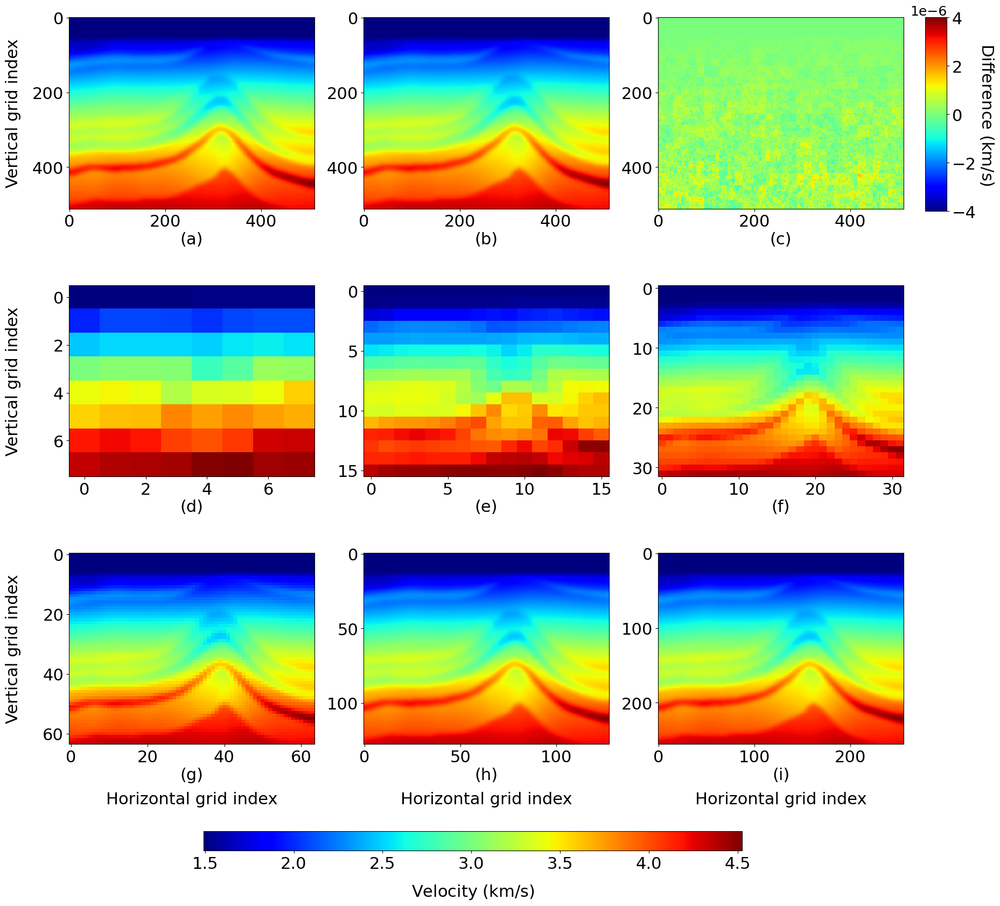

In [121]:
import string
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------------------------------
# ORIGINAL PARAMETERS (unchanged)
# -------------------------------------------------------------------------
max_level_to_plot = 6
wavelet = 'haar'

# Collect the images for consistent color scaling
all_images = [
    reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    for i in range(max_level_to_plot + 1)
]
vmin2 = min(img.min() for img in all_images)/1000.0
vmax2 = max(img.max() for img in all_images)/1000.0

fig, axes = plt.subplots(
    3,
    3,
    figsize=(20, 18),
    gridspec_kw={'hspace': 0.4, 'wspace': 0.2}
)
fig.subplots_adjust(hspace=0.6, top=0.88)  # Adjust space for better fit

# Generate alphabetic labels (a, b, c, ...)
labels = list(string.ascii_lowercase)
label_fontsize = 22  # Increased font size for clarity

# -------------------------------------------------------------------------
# FIRST ROW ----------------------------------------------------------------
# -------------------------------------------------------------------------
ax = axes.flat[0]
img = vp_upsamp512x512
im1 = ax.imshow(
    img / 1000.0,
    cmap='jet',
    aspect='auto',
    vmin=vmin2,
    vmax=vmax2
)
ax.tick_params(axis='x', labelsize=22)
ax.tick_params(axis='y', labelsize=22)

ax = axes.flat[1]
img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][6]
im1 = ax.imshow(
    img / 1000.0,
    cmap='jet',
    aspect='auto',
    vmin=vmin2,
    vmax=vmax2
)
ax.tick_params(axis='x', labelsize=22)
ax.tick_params(axis='y', labelsize=22)

ax = axes.flat[2]
img = (
    reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][6]
    - vp_upsamp512x512
)
im2 = ax.imshow(
    img / 1000.0,
    cmap='jet',
    aspect='auto',
    vmin=-0.004/1000.0,
    vmax=0.004/1000.0
)
ax.tick_params(axis='x', labelsize=22)
ax.tick_params(axis='y', labelsize=22)

# -------------------------------------------------------------------------
# REMAINING PANELS ---------------------------------------------------------
# -------------------------------------------------------------------------
for i in range(0, max_level_to_plot):
    ax = axes.flat[i + 3]
    img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    im1 = ax.imshow(
        img / 1000.0,
        cmap='jet',
        aspect='auto',
        vmin=vmin2,
        vmax=vmax2
    )
    ax.tick_params(axis='x', labelsize=22)
    ax.tick_params(axis='y', labelsize=22)

# -------------------------------------------------------------------------
# *** NEW SECTION ***
# (a) panel letters centred **below** each subplot
# (b) Y-axis label only for first column
# (c) X-axis label only for last row
# (d) align Y-labels across the first column
# -------------------------------------------------------------------------
xlabel_txt = 'Horizontal grid index'
ylabel_txt = 'Vertical grid index'
letter_offset = -0.12      # how far below the image (axes fraction)
labelpad_bottom = 35       # space between image and bottom X-label

for idx, ax in enumerate(axes.flat):
    row, col = divmod(idx, 3)  # 3 columns → (row, col)

    # -- panel letter centred below each image ----------------------------
    ax.text(
        0.5,
        letter_offset,
        f'({labels[idx]})',
        transform=ax.transAxes,
        fontsize=label_fontsize,
        ha='center',
        va='top'
    )

    # -- Y axis label only for first column -------------------------------
    if col == 0:
        ax.set_ylabel(ylabel_txt, fontsize=22, labelpad=15)
    else:
        ax.set_ylabel('')

    # -- X axis label only for bottom row ---------------------------------
    if row == 2:
        ax.set_xlabel(xlabel_txt, fontsize=22, labelpad=labelpad_bottom)
    else:
        ax.set_xlabel('')

    # -- make sure tick labels are visible everywhere ---------------------
    ax.tick_params(axis='x', labelsize=22, labelbottom=True)
    ax.tick_params(axis='y', labelsize=22, labelleft=True)

# Align Y-labels in the first column so they sit on one vertical line
fig.align_ylabels(axes[:, 0])

# -------------------------------------------------------------------------
# COLOUR-BARS (unchanged)
# -------------------------------------------------------------------------
cbar_ax1 = fig.add_axes([0.25, 0.02, 0.5, 0.02])  # [left, bottom, width, height]
cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal')
cbar1.ax.tick_params(labelsize=22)
cbar1.set_label(r"Velocity ($\mathrm{km/s}$)", fontsize=22, labelpad=15)
cbar1.ax.xaxis.set_label_position("bottom")
cbar1.ax.yaxis.offsetText.set_fontsize(24)  # or any desired fontsize

cbar_ax2 = fig.add_axes([0.92, 0.68, 0.02, 0.2])  # Placed vertically to the side
cbar2 = fig.colorbar(im2, cax=cbar_ax2, orientation='vertical')
cbar2.ax.yaxis.set_label_position("right")
cbar2.ax.tick_params(labelsize=22)
cbar2.set_label(r"Difference ($\mathrm{km/s}$)", fontsize=22, labelpad=25, rotation=270)

plt.subplots_adjust(bottom=0.13)  # Push colorbar lower
# -------------------------------------------------------------------------
# SAVE / SHOW (unchanged)
# -------------------------------------------------------------------------
cbar1.ax.xaxis.get_offset_text().set_fontsize(18)   # horizontal bar
cbar2.ax.yaxis.get_offset_text().set_fontsize(18)   # vertical bar
plt.savefig(f'./plots/BP_Test_Rec_velocity_Haar_with_Lmax6_IP512x512_4paper_withoutTitles.png', dpi=300, bbox_inches='tight')
plt.show()


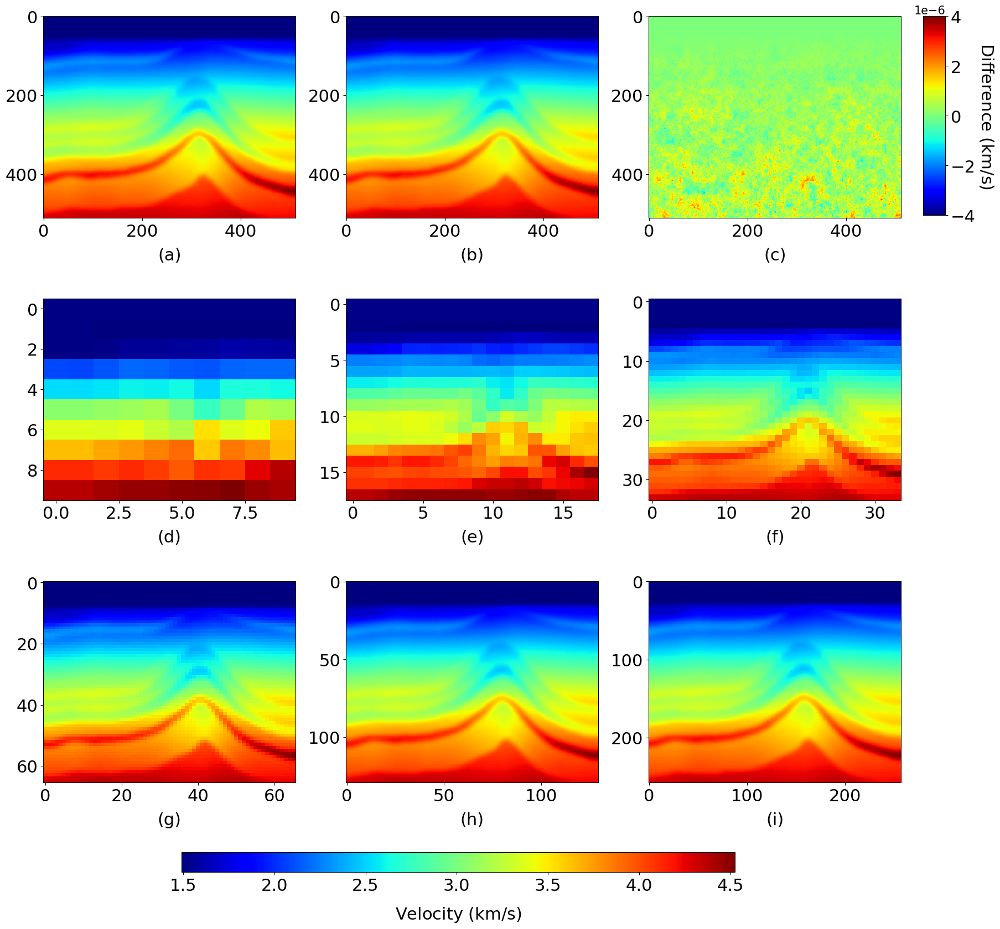

In [17]:
max_level_to_plot = 6
wavelet = 'db2'

# Collect the images for consistent color scaling
all_images = [
    reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    for i in range(max_level_to_plot + 1)
]
vmin2 = min(img.min() for img in all_images)/1000.0
vmax2 = max(img.max() for img in all_images)/1000.0

fig, axes = plt.subplots(3, 3, figsize=(20, 18), gridspec_kw={'hspace': 0.4, 'wspace': 0.2})
fig.subplots_adjust(hspace=0.6, top=0.88)  # Adjust space for better fit

# Generate alphabetic labels (A, B, C, ...)
labels = list(string.ascii_lowercase)
label_fontsize = 22  # Increased font size for clarity

ax = axes.flat[0]
img = vp_upsamp512x512
im1 = ax.imshow(img/1000.0, cmap='jet', aspect='auto', vmin=vmin2, vmax=vmax2)
# ax.set_title('Input model', pad=15, fontsize=18)
ax.set_xlabel(f'({labels[0]})', fontsize=label_fontsize, labelpad=10)
ax.tick_params(axis='x', labelsize=22)
ax.tick_params(axis='y', labelsize=22)

ax = axes.flat[1]
img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][6]
im1 = ax.imshow(img/1000.0, cmap='jet', aspect='auto', vmin=vmin2, vmax=vmax2)
# ax.set_title('Reconstructed model', pad=15, fontsize=18)
ax.set_xlabel(f'({labels[1]})', fontsize=label_fontsize, labelpad=10)
ax.tick_params(axis='x', labelsize=22)
ax.tick_params(axis='y', labelsize=22)

ax = axes.flat[2]
img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][6] - vp_upsamp512x512
im2 = ax.imshow(img/1000.0, cmap='jet', aspect='auto', vmin=-0.004/1000.0, vmax=0.004/1000.0)
# ax.set_title('Difference', pad=15, fontsize=18)
ax.set_xlabel(f'({labels[2]})', fontsize=label_fontsize, labelpad=10)
ax.tick_params(axis='x', labelsize=22)
ax.tick_params(axis='y', labelsize=22)

for i in range(0, max_level_to_plot):
    ax = axes.flat[i+3]
    img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    im1 = ax.imshow(img/1000.0, cmap='jet', aspect='auto', vmin=vmin2, vmax=vmax2)
    # ax.set_title(f'Level {i} - size ({img.shape[0]}, {img.shape[1]})', pad=15, fontsize=18)
    ax.set_xlabel(f'({labels[i+3]})', fontsize=label_fontsize, labelpad=10)
    ax.tick_params(axis='x', labelsize=22)
    ax.tick_params(axis='y', labelsize=22)


cbar_ax1 = fig.add_axes([0.25, 0.02, 0.5, 0.02])  # [left, bottom, width, height]
cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal')
cbar1.ax.tick_params(labelsize=22)  # Larger tick labels
cbar1.set_label(r"Velocity ($\mathrm{km/s}$)", fontsize=22, labelpad=15)
cbar1.ax.xaxis.set_label_position("bottom")  # Move label below

cbar_ax2 = fig.add_axes([0.92, 0.68, 0.02, 0.2])  # Placed vertically to the side
cbar2 = fig.colorbar(im2, cax=cbar_ax2, orientation='vertical')
cbar2.ax.yaxis.set_label_position("right")  # Keep label on the right
cbar2.ax.tick_params(labelsize=22)  # Larger tick labels
cbar2.set_label(r"Difference ($\mathrm{km/s}$)", fontsize=22, labelpad=25, rotation=270)

# Add main title
# fig.suptitle(f'Reconstructed velocity with Haar wavelet', fontsize=22, y=0.95)
plt.savefig(f'./plots/BP_Test_Rec_velocity_DB2_with_Lmax6_IP512x512_4CWPannMeeting_withoutTitles.png', dpi=300, bbox_inches='tight')
plt.show()

### Save the images not displayed

In [24]:
max_level_to_plot = 6
# wavelet = 'haar'

for wavelet in wavelet_types:
    fig, axes = plt.subplots(2, 5, figsize=(25, 8), gridspec_kw={'hspace': 0.5, 'wspace': 0.4})
    fig.subplots_adjust(hspace=0.55, top=0.85)  # Adjust top for title placement

    # Collect the images for consistent color scaling
    all_images = [
        reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
        for i in range(max_level_to_plot + 1)
    ]
    vmin = min(img.min() for img in all_images)
    vmax = max(img.max() for img in all_images)

    # Plot each reconstruction level
    for i in range(max_level_to_plot + 1):
        ax = axes.flat[i]
        img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
        im = ax.imshow(img, cmap='jet', aspect='auto', vmin=vmin, vmax=vmax)
        ax.set_title( f'Level {i} - size ({img.shape[0]}, {img.shape[1]})', pad=15, fontsize=16)
        ax.tick_params(axis='x', labelsize=16)
        ax.tick_params(axis='y', labelsize=16)

    # Remove unused axes
    for i in range(max_level_to_plot + 1, len(axes.flat)):
        fig.delaxes(axes.flat[i])

    # Add colorbar outside the plots
    cbar_ax = fig.add_axes([0.45, 0.001, 0.2, 0.02])  # [left, bottom, width, height]
    fig.colorbar(im, cax=cbar_ax, orientation='horizontal', shrink=0.1)
    cbar_ax.set_title(r"Velocity ($\mathrm{m/s}$)", fontsize=16, pad=15)

    # Add main title
    fig.suptitle(f'Reconstructed velocity with {wavelet} wavelet', fontsize=16, y=1)
    plt.savefig(f'./plots/Test_Rec_velocity_{wavelet}_with_Lmax{max_level_to_plot}_IP512x512.png', dpi=300, bbox_inches='tight')
    plt.close()

In [9]:
print('db2 shape l6', reconstruct_images_IP512['db2'][6]['accumulative_levels'][6].shape)
print('db2 shape l5', reconstruct_images_IP512['db2'][6]['accumulative_levels'][5].shape)
print('db2 shape l4', reconstruct_images_IP512['db2'][6]['accumulative_levels'][4].shape)
print('db2 shape l3', reconstruct_images_IP512['db2'][6]['accumulative_levels'][3].shape)
print('db2 shape l2', reconstruct_images_IP512['db2'][6]['accumulative_levels'][2].shape)
print('db2 shape l1', reconstruct_images_IP512['db2'][6]['accumulative_levels'][1].shape)
print('db2 shape l0', reconstruct_images_IP512['db2'][6]['accumulative_levels'][0].shape)
print('\n')

print('sym2 shape l6', reconstruct_images_IP512['sym2'][6]['accumulative_levels'][6].shape)
print('sym2 shape l5', reconstruct_images_IP512['sym2'][6]['accumulative_levels'][5].shape)
print('sym2 shape l4', reconstruct_images_IP512['sym2'][6]['accumulative_levels'][4].shape)
print('\n')

print('coif2 shape l6', reconstruct_images_IP512['coif2'][6]['accumulative_levels'][6].shape)
print('coif2 shape l5', reconstruct_images_IP512['coif2'][6]['accumulative_levels'][5].shape)
print('coif2 shape l4', reconstruct_images_IP512['coif2'][6]['accumulative_levels'][4].shape)
print('\n')

print('bior1.3 shape l6', reconstruct_images_IP512['bior1.3'][6]['accumulative_levels'][6].shape)
print('bior1.3 shape l5', reconstruct_images_IP512['bior1.3'][6]['accumulative_levels'][5].shape)
print('bior1.3 shape l4', reconstruct_images_IP512['bior1.3'][6]['accumulative_levels'][4].shape)
print('bior1.3 shape l3', reconstruct_images_IP512['bior1.3'][6]['accumulative_levels'][3].shape)
print('bior1.3 shape l2', reconstruct_images_IP512['bior1.3'][6]['accumulative_levels'][2].shape)
print('bior1.3 shape l1', reconstruct_images_IP512['bior1.3'][6]['accumulative_levels'][1].shape)
print('bior1.3 shape l0', reconstruct_images_IP512['bior1.3'][6]['accumulative_levels'][0].shape)

db2 shape l6 (512, 512)
db2 shape l5 (258, 258)
db2 shape l4 (130, 130)
db2 shape l3 (66, 66)
db2 shape l2 (34, 34)
db2 shape l1 (18, 18)
db2 shape l0 (10, 10)


sym2 shape l6 (512, 512)
sym2 shape l5 (258, 258)
sym2 shape l4 (130, 130)


coif2 shape l6 (512, 512)
coif2 shape l5 (262, 262)
coif2 shape l4 (136, 136)


bior1.3 shape l6 (512, 512)
bior1.3 shape l5 (258, 258)
bior1.3 shape l4 (132, 132)
bior1.3 shape l3 (68, 68)
bior1.3 shape l2 (36, 36)
bior1.3 shape l1 (20, 20)
bior1.3 shape l0 (12, 12)


In [10]:
reconstruct_images_IP512_haar_MaxL6_recImage512x512_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['haar'][6]['accumulative_levels'][6], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())
reconstruct_images_IP512_haar_MaxL6_recImage256x256_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['haar'][6]['accumulative_levels'][5], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())
reconstruct_images_IP512_haar_MaxL6_recImage128x128_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['haar'][6]['accumulative_levels'][4], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())

diff_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450 = vp - reconstruct_images_IP512_haar_MaxL6_recImage512x512_downsamp180x450
diff_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450 = vp - reconstruct_images_IP512_haar_MaxL6_recImage256x256_downsamp180x450
diff_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450 = vp - reconstruct_images_IP512_haar_MaxL6_recImage128x128_downsamp180x450
### rmse
rmse_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_haar_MaxL6_recImage512x512_downsamp180x450)**2))
rmse_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_haar_MaxL6_recImage256x256_downsamp180x450)**2))
rmse_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_haar_MaxL6_recImage128x128_downsamp180x450)**2))
### ssim
ssim_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450 = ssim(vp, reconstruct_images_IP512_haar_MaxL6_recImage512x512_downsamp180x450, data_range=vp.max() - vp.min())
ssim_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450 = ssim(vp, reconstruct_images_IP512_haar_MaxL6_recImage256x256_downsamp180x450, data_range=vp.max() - vp.min())
ssim_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450 = ssim(vp, reconstruct_images_IP512_haar_MaxL6_recImage128x128_downsamp180x450, data_range=vp.max() - vp.min())
#########################
reconstruct_images_IP512_db2_MaxL6_recImage512x512_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['db2'][6]['accumulative_levels'][6], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())
reconstruct_images_IP512_db2_MaxL6_recImage258x258_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['db2'][6]['accumulative_levels'][5], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())
reconstruct_images_IP512_db2_MaxL6_recImage130x130_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['db2'][6]['accumulative_levels'][4], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())

diff_IP512_orig_db2_MaxL6_recImage512x512_downsamp180x450 = vp - reconstruct_images_IP512_db2_MaxL6_recImage512x512_downsamp180x450
diff_IP512_orig_db2_MaxL6_recImage258x258_downsamp180x450 = vp - reconstruct_images_IP512_db2_MaxL6_recImage258x258_downsamp180x450
diff_IP512_orig_db2_MaxL6_recImage130x130_downsamp180x450 = vp - reconstruct_images_IP512_db2_MaxL6_recImage130x130_downsamp180x450
### rmse
rmse_IP512_orig_db2_MaxL6_recImage512x512_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_db2_MaxL6_recImage512x512_downsamp180x450)**2))
rmse_IP512_orig_db2_MaxL6_recImage258x258_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_db2_MaxL6_recImage258x258_downsamp180x450)**2))
rmse_IP512_orig_db2_MaxL6_recImage130x130_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_db2_MaxL6_recImage130x130_downsamp180x450)**2))
### ssim
ssim_IP512_orig_db2_MaxL6_recImage512x512_downsamp180x450 = ssim(vp, reconstruct_images_IP512_db2_MaxL6_recImage512x512_downsamp180x450, data_range=vp.max() - vp.min())
ssim_IP512_orig_db2_MaxL6_recImage258x258_downsamp180x450 = ssim(vp, reconstruct_images_IP512_db2_MaxL6_recImage258x258_downsamp180x450, data_range=vp.max() - vp.min())
ssim_IP512_orig_db2_MaxL6_recImage130x130_downsamp180x450 = ssim(vp, reconstruct_images_IP512_db2_MaxL6_recImage130x130_downsamp180x450, data_range=vp.max() - vp.min())
#########################
reconstruct_images_IP512_sym2_MaxL6_recImage512x512_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['sym2'][6]['accumulative_levels'][6], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())
reconstruct_images_IP512_sym2_MaxL6_recImage258x258_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['sym2'][6]['accumulative_levels'][5], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())
reconstruct_images_IP512_sym2_MaxL6_recImage130x130_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['sym2'][6]['accumulative_levels'][4], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())

diff_IP512_orig_sym2_MaxL6_recImage512x512_downsamp180x450 = vp - reconstruct_images_IP512_sym2_MaxL6_recImage512x512_downsamp180x450
diff_IP512_orig_sym2_MaxL6_recImage258x258_downsamp180x450 = vp - reconstruct_images_IP512_sym2_MaxL6_recImage258x258_downsamp180x450
diff_IP512_orig_sym2_MaxL6_recImage130x130_downsamp180x450 = vp - reconstruct_images_IP512_sym2_MaxL6_recImage130x130_downsamp180x450
### rmse
rmse_IP512_orig_sym2_MaxL6_recImage512x512_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_sym2_MaxL6_recImage512x512_downsamp180x450)**2))
rmse_IP512_orig_sym2_MaxL6_recImage258x258_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_sym2_MaxL6_recImage258x258_downsamp180x450)**2))
rmse_IP512_orig_sym2_MaxL6_recImage130x130_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_sym2_MaxL6_recImage130x130_downsamp180x450)**2))
### ssim
ssim_IP512_orig_sym2_MaxL6_recImage512x512_downsamp180x450 = ssim(vp, reconstruct_images_IP512_sym2_MaxL6_recImage512x512_downsamp180x450, data_range=vp.max() - vp.min())
ssim_IP512_orig_sym2_MaxL6_recImage258x258_downsamp180x450 = ssim(vp, reconstruct_images_IP512_sym2_MaxL6_recImage258x258_downsamp180x450, data_range=vp.max() - vp.min())
ssim_IP512_orig_sym2_MaxL6_recImage130x130_downsamp180x450 = ssim(vp, reconstruct_images_IP512_sym2_MaxL6_recImage130x130_downsamp180x450, data_range=vp.max() - vp.min())
#########################
reconstruct_images_IP512_coif2_MaxL6_recImage512x512_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['coif2'][6]['accumulative_levels'][6], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())
reconstruct_images_IP512_coif2_MaxL6_recImage262x262_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['coif2'][6]['accumulative_levels'][5], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())
reconstruct_images_IP512_coif2_MaxL6_recImage136x136_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['coif2'][6]['accumulative_levels'][4], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())

diff_IP512_orig_coif2_MaxL6_recImage512x512_downsamp180x450 = vp - reconstruct_images_IP512_coif2_MaxL6_recImage512x512_downsamp180x450
diff_IP512_orig_coif2_MaxL6_recImage262x262_downsamp180x450 = vp - reconstruct_images_IP512_coif2_MaxL6_recImage262x262_downsamp180x450
diff_IP512_orig_coif2_MaxL6_recImage136x136_downsamp180x450 = vp - reconstruct_images_IP512_coif2_MaxL6_recImage136x136_downsamp180x450
### rmse
rmse_IP512_orig_coif2_MaxL6_recImage512x512_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_coif2_MaxL6_recImage512x512_downsamp180x450)**2))
rmse_IP512_orig_coif2_MaxL6_recImage262x262_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_coif2_MaxL6_recImage262x262_downsamp180x450)**2))
rmse_IP512_orig_coif2_MaxL6_recImage136x136_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_coif2_MaxL6_recImage136x136_downsamp180x450)**2))
### ssim
ssim_IP512_orig_coif2_MaxL6_recImage512x512_downsamp180x450 = ssim(vp, reconstruct_images_IP512_coif2_MaxL6_recImage512x512_downsamp180x450, data_range=vp.max() - vp.min())
ssim_IP512_orig_coif2_MaxL6_recImage262x262_downsamp180x450 = ssim(vp, reconstruct_images_IP512_coif2_MaxL6_recImage262x262_downsamp180x450, data_range=vp.max() - vp.min())
ssim_IP512_orig_coif2_MaxL6_recImage136x136_downsamp180x450 = ssim(vp, reconstruct_images_IP512_coif2_MaxL6_recImage136x136_downsamp180x450, data_range=vp.max() - vp.min())
#########################
reconstruct_images_IP512_bior13_MaxL6_recImage512x512_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['bior1.3'][6]['accumulative_levels'][6], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())
reconstruct_images_IP512_bior13_MaxL6_recImage258x258_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['bior1.3'][6]['accumulative_levels'][5], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())
reconstruct_images_IP512_bior13_MaxL6_recImage130x130_downsamp180x450 = (F.interpolate(torch.tensor(reconstruct_images_IP512['bior1.3'][6]['accumulative_levels'][4], dtype=torch.float32).unsqueeze(0).unsqueeze(0), size=(180, 450), mode='nearest-exact').squeeze().numpy())

diff_IP512_orig_bior13_MaxL6_recImage512x512_downsamp180x450 = vp - reconstruct_images_IP512_bior13_MaxL6_recImage512x512_downsamp180x450
diff_IP512_orig_bior13_MaxL6_recImage258x258_downsamp180x450 = vp - reconstruct_images_IP512_bior13_MaxL6_recImage258x258_downsamp180x450
diff_IP512_orig_bior13_MaxL6_recImage130x130_downsamp180x450 = vp - reconstruct_images_IP512_bior13_MaxL6_recImage130x130_downsamp180x450
### rmse
rmse_IP512_orig_bior13_MaxL6_recImage512x512_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_bior13_MaxL6_recImage512x512_downsamp180x450)**2))
rmse_IP512_orig_bior13_MaxL6_recImage258x258_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_bior13_MaxL6_recImage258x258_downsamp180x450)**2))
rmse_IP512_orig_bior13_MaxL6_recImage130x130_downsamp180x450 =  np.sqrt(np.mean((vp - reconstruct_images_IP512_bior13_MaxL6_recImage130x130_downsamp180x450)**2))
### ssim
ssim_IP512_orig_bior13_MaxL6_recImage512x512_downsamp180x450 = ssim(vp, reconstruct_images_IP512_bior13_MaxL6_recImage512x512_downsamp180x450, data_range=vp.max() - vp.min())
ssim_IP512_orig_bior13_MaxL6_recImage258x258_downsamp180x450 = ssim(vp, reconstruct_images_IP512_bior13_MaxL6_recImage258x258_downsamp180x450, data_range=vp.max() - vp.min())
ssim_IP512_orig_bior13_MaxL6_recImage130x130_downsamp180x450 = ssim(vp, reconstruct_images_IP512_bior13_MaxL6_recImage130x130_downsamp180x450, data_range=vp.max() - vp.min())


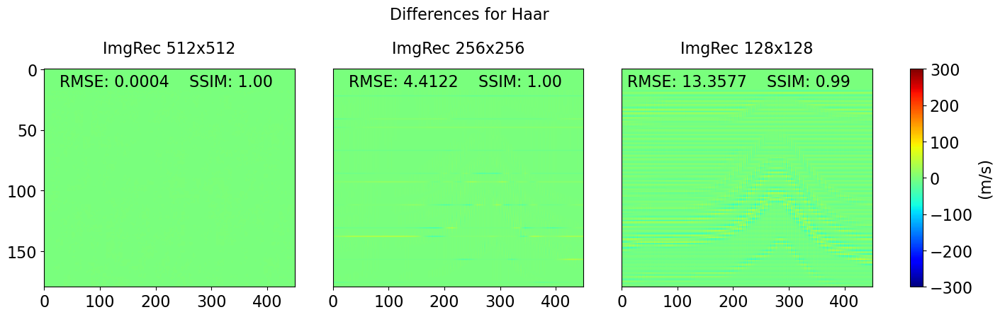

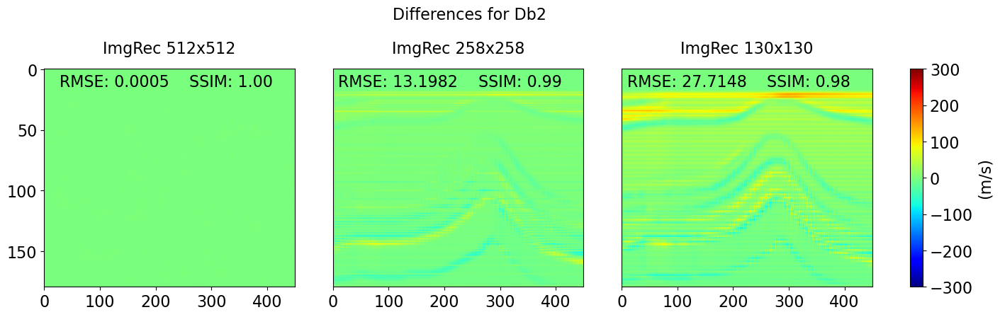

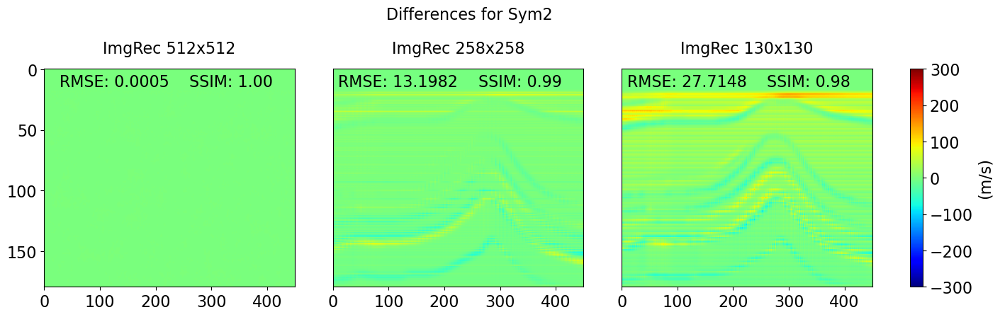

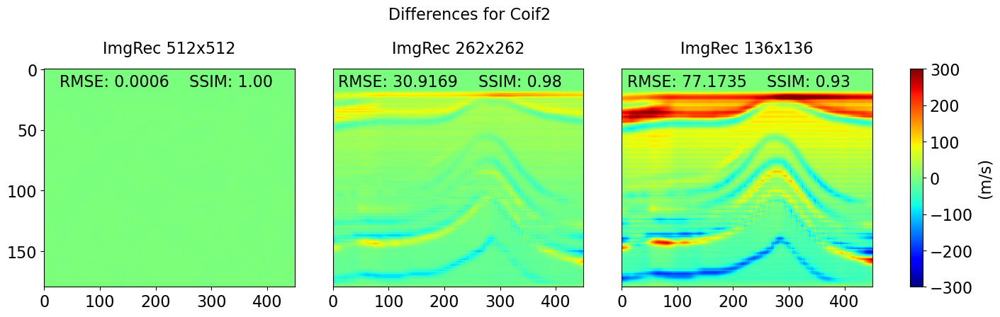

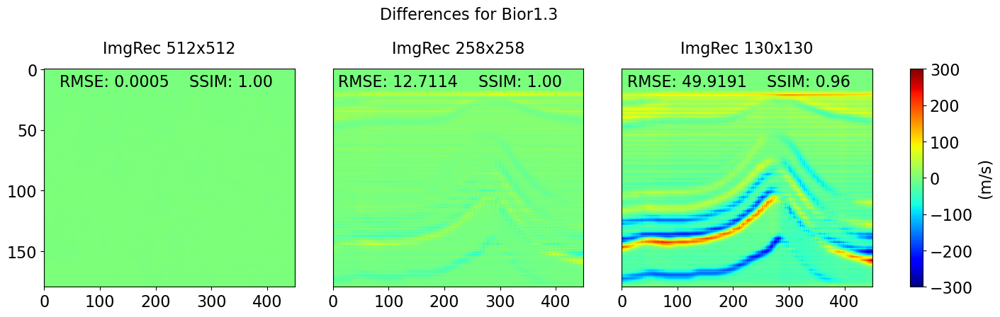

In [36]:
# Dictionary of wavelet names and their corresponding data
wavelet_data = {
    'Haar': {
        'data': [
            diff_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450,
            diff_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450,
            diff_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450
        ],
        'titles': ['ImgRec 512x512', 'ImgRec 256x256', 'ImgRec 128x128'],
        'vmax': [300, 300, 300],
        'vmin': [-300, -300, -300],
        'rmse': [rmse_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450, 
                rmse_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450, 
                rmse_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450],
        'ssim': [ssim_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450, 
                ssim_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450, 
                ssim_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450]

    },
    'Db2': {
        'data': [
            diff_IP512_orig_db2_MaxL6_recImage512x512_downsamp180x450,
            diff_IP512_orig_db2_MaxL6_recImage258x258_downsamp180x450,
            diff_IP512_orig_db2_MaxL6_recImage130x130_downsamp180x450
        ],
        'titles': ['ImgRec 512x512', 'ImgRec 258x258', 'ImgRec 130x130'],
        'vmax': [300, 300, 300],
        'vmin': [-300, -300, -300],
        'rmse': [rmse_IP512_orig_db2_MaxL6_recImage512x512_downsamp180x450, 
                rmse_IP512_orig_db2_MaxL6_recImage258x258_downsamp180x450, 
                rmse_IP512_orig_db2_MaxL6_recImage130x130_downsamp180x450],
        'ssim': [ssim_IP512_orig_db2_MaxL6_recImage512x512_downsamp180x450,
                ssim_IP512_orig_db2_MaxL6_recImage258x258_downsamp180x450,
                ssim_IP512_orig_db2_MaxL6_recImage130x130_downsamp180x450]
    },
    'Sym2': {
        'data': [
            diff_IP512_orig_sym2_MaxL6_recImage512x512_downsamp180x450,
            diff_IP512_orig_sym2_MaxL6_recImage258x258_downsamp180x450,
            diff_IP512_orig_sym2_MaxL6_recImage130x130_downsamp180x450
        ],
        'titles': ['ImgRec 512x512', 'ImgRec 258x258', 'ImgRec 130x130'],
        'vmax': [300, 300, 300],
        'vmin': [-300, -300, -300],
        'rmse': [rmse_IP512_orig_sym2_MaxL6_recImage512x512_downsamp180x450, 
                rmse_IP512_orig_sym2_MaxL6_recImage258x258_downsamp180x450, 
                rmse_IP512_orig_sym2_MaxL6_recImage130x130_downsamp180x450],
        'ssim': [ssim_IP512_orig_sym2_MaxL6_recImage512x512_downsamp180x450,
                ssim_IP512_orig_sym2_MaxL6_recImage258x258_downsamp180x450,
                ssim_IP512_orig_sym2_MaxL6_recImage130x130_downsamp180x450]
    },
    'Coif2': {
        'data': [
            diff_IP512_orig_coif2_MaxL6_recImage512x512_downsamp180x450,
            diff_IP512_orig_coif2_MaxL6_recImage262x262_downsamp180x450,
            diff_IP512_orig_coif2_MaxL6_recImage136x136_downsamp180x450
        ],
        'titles': ['ImgRec 512x512', 'ImgRec 262x262', 'ImgRec 136x136'],
        'vmax': [300, 300, 300],
        'vmin': [-300, -300, -300],
        'rmse': [rmse_IP512_orig_coif2_MaxL6_recImage512x512_downsamp180x450, 
                rmse_IP512_orig_coif2_MaxL6_recImage262x262_downsamp180x450, 
                rmse_IP512_orig_coif2_MaxL6_recImage136x136_downsamp180x450],
        'ssim': [ssim_IP512_orig_coif2_MaxL6_recImage512x512_downsamp180x450,
                ssim_IP512_orig_coif2_MaxL6_recImage262x262_downsamp180x450,
                ssim_IP512_orig_coif2_MaxL6_recImage136x136_downsamp180x450]
    },
    'Bior1.3': {
        'data': [
            diff_IP512_orig_bior13_MaxL6_recImage512x512_downsamp180x450,
            diff_IP512_orig_bior13_MaxL6_recImage258x258_downsamp180x450,
            diff_IP512_orig_bior13_MaxL6_recImage130x130_downsamp180x450
        ],
        'titles': ['ImgRec 512x512', 'ImgRec 258x258', 'ImgRec 130x130'],
        'vmax': [300, 300, 300],
        'vmin': [-300, -300, -300],
        'rmse': [rmse_IP512_orig_bior13_MaxL6_recImage512x512_downsamp180x450, 
                rmse_IP512_orig_bior13_MaxL6_recImage258x258_downsamp180x450, 
                rmse_IP512_orig_bior13_MaxL6_recImage130x130_downsamp180x450],
        'ssim': [ssim_IP512_orig_bior13_MaxL6_recImage512x512_downsamp180x450,
                ssim_IP512_orig_bior13_MaxL6_recImage258x258_downsamp180x450,
                ssim_IP512_orig_bior13_MaxL6_recImage130x130_downsamp180x450]
    }
}

# Loop through each wavelet
for wavelet, details in wavelet_data.items():
    fig = plt.figure(figsize=(16, 4))
    gs = GridSpec(1, 4, width_ratios=[1, 1, 1, 0.05], figure=fig)  # 3 plots + 1 for colorbar

    axes = []
    for i, data in enumerate(details['data']):
        ax = fig.add_subplot(gs[0, i])
        im = ax.imshow(data, cmap='jet', aspect='auto', vmax=details['vmax'][i], vmin=details['vmin'][i])
        ax.set_title(details['titles'][i], pad=16, fontsize=16)

        # Keep yticks only for the first plot
        if i != 0:
            ax.set_yticks([])

        ax.tick_params(axis='both', which='major', labelsize=16)  # Change labelsize as needed
        ax.tick_params(axis='both', which='minor', labelsize=16)
        ## write rmse values to figure on the x axis
        ax.text(0.50, 0.94, f"RMSE: {details['rmse'][i]:.4f}", fontsize=16, ha='right', va='center', transform=ax.transAxes)
        ax.text(0.58, 0.94, f"SSIM: {details['ssim'][i]:.2f}", fontsize=16, ha='left', va='center', transform=ax.transAxes)

        axes.append(ax)

    # Add a single colorbar to the right
    cbar_ax = fig.add_subplot(gs[0, 3])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=16)  # Adjust colorbar tick size if needed
    cbar.set_label('(m/s)', fontsize=16)  # Add colorbar label

    # Add a title for the entire figure
    plt.suptitle(f'Differences for {wavelet}', fontsize=16, y=1.1)
    plt.subplots_adjust(hspace=0.3, wspace=0.2)  # Adjust spacing

    # Save the figure
    plt.savefig(f'./plots/BP_Test_diff_orig_and_IP512x512_{wavelet}_MaxL6_recImages_downsamp174x500_RMSEcalc.png', dpi=300, bbox_inches='tight')
    plt.show()

### Replotting for paper

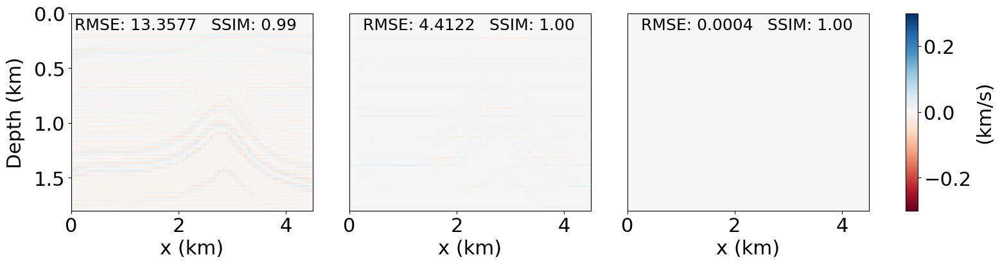

In [12]:
# Dictionary of wavelet names and their corresponding data
wavelet_data_4plotting = {
    'Haar': {
        'data': [
            diff_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450,
            diff_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450,
            diff_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450
        ],
        'titles': ['ImgRec 128x128', 'ImgRec 256x256', 'ImgRec 512x512'],
        'vmax': [0.3, 0.3, 0.3],
        'vmin': [-0.3, -0.3, -0.3],
        'rmse': [rmse_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450,
                 rmse_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450, 
                 rmse_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450],
        'ssim': [ssim_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450,
                 ssim_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450, 
                 ssim_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450]
    },
}

extents = [0, 4.5, 1.8, 0]

# Generate alphabetic labels (A, B, C, ...)
labels = list(string.ascii_lowercase)
label_fontsize = 22  # Increased font size for clarity

# Loop through each wavelet
for wavelet, details in wavelet_data_4plotting.items():
    fig = plt.figure(figsize=(17, 4))
    gs = GridSpec(1, 4, width_ratios=[1, 1, 1, 0.05], figure=fig)  # 3 plots + 1 for colorbar

    axes = []
    for i, data in enumerate(details['data']):
        ax = fig.add_subplot(gs[0, i])
        im = ax.imshow(data/1000.0, cmap='RdBu', aspect='auto', vmax=details['vmax'][i], vmin=details['vmin'][i], extent=extents)
        # ax.set_title(details['titles'][i], pad=16, fontsize=18)
        ax.text(0.5, -0.35, f'({labels[i]})', fontsize=label_fontsize, ha='center', va='center', transform=ax.transAxes)

        # Keep yticks only for the first plot
        if i != 0:
            ax.set_yticks([])

        if i == 0:
            ax.set_ylabel('Depth (km)', fontsize=22, labelpad=10)
        else:
            ax.set_ylabel('')

        ax.set_xlabel('x (km)', fontsize=22)
        ax.tick_params(axis='both', which='major', labelsize=22)  # Change labelsize as needed
        ax.tick_params(axis='both', which='minor', labelsize=22)
        ## write rmse values to figure on the x axis
        ax.text(0.52, 0.94, f"RMSE: {details['rmse'][i]:.4f}", fontsize=18, ha='right', va='center', transform=ax.transAxes)
        ax.text(0.58, 0.94, f"SSIM: {details['ssim'][i]:.2f}", fontsize=18, ha='left', va='center', transform=ax.transAxes)
        axes.append(ax)

    # Add a single colorbar to the right
    cbar_ax = fig.add_subplot(gs[0, 3])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=22)  # Adjust colorbar tick size if needed
    cbar.set_label('(km/s)', fontsize=22)  # Add colorbar label

    # Add a title for the entire figure
    # plt.suptitle(f'Differences for {wavelet}', fontsize=18, y=1.1)
    # plt.subplots_adjust(hspace=0.3, wspace=0.2)  # Adjust spacing

    # Save the figure
    plt.savefig(f'./plots/BP_Test_diff_orig_and_IP512x512_Haar_MaxL6_recImages_downsamp180x450_RMSEcalc_4paper_withLabels.png', dpi=300, bbox_inches='tight')
    plt.show()

In [13]:
np.save("/Users/ahmedahmed/Documents/07_Test/HaarTransform/wt_test/BP/vp_original.npy", vp)

In [14]:
# Data dictionary: Transform names and associated data
reconstruct_images = {
    "haar": {
        "512x512": reconstruct_images_IP512_haar_MaxL6_recImage512x512_downsamp180x450,
        "256x256": reconstruct_images_IP512_haar_MaxL6_recImage256x256_downsamp180x450,
        "128x128": reconstruct_images_IP512_haar_MaxL6_recImage128x128_downsamp180x450,
    },
    "db2": {
        "512x512": reconstruct_images_IP512_db2_MaxL6_recImage512x512_downsamp180x450,
        "258x258": reconstruct_images_IP512_db2_MaxL6_recImage258x258_downsamp180x450,
        "130x130": reconstruct_images_IP512_db2_MaxL6_recImage130x130_downsamp180x450,
    },
    "sym2": {
        "512x512": reconstruct_images_IP512_sym2_MaxL6_recImage512x512_downsamp180x450,
        "258x258": reconstruct_images_IP512_sym2_MaxL6_recImage258x258_downsamp180x450,
        "130x130": reconstruct_images_IP512_sym2_MaxL6_recImage130x130_downsamp180x450,
    },
    "coif2": {
        "512x512": reconstruct_images_IP512_coif2_MaxL6_recImage512x512_downsamp180x450,
        "262x262": reconstruct_images_IP512_coif2_MaxL6_recImage262x262_downsamp180x450,
        "136x136": reconstruct_images_IP512_coif2_MaxL6_recImage136x136_downsamp180x450,
    },
    "bior13": {
        "512x512": reconstruct_images_IP512_bior13_MaxL6_recImage512x512_downsamp180x450,
        "258x258": reconstruct_images_IP512_bior13_MaxL6_recImage258x258_downsamp180x450,
        "130x130": reconstruct_images_IP512_bior13_MaxL6_recImage130x130_downsamp180x450,
    }
}

# Base path
base_path = "/Users/ahmedahmed/Documents/07_Test/HaarTransform/wt_test/BP"

# Save each file programmatically
for transform, images in reconstruct_images.items():
    for size, data in images.items():
        file_path = f"{base_path}/reconstruct_images_IP512_{transform}_MaxL6_recImage{size}_downsamp180x450.npy"
        np.save(file_path, data)
        print(f"Saved: {file_path}")


Saved: /Users/ahmedahmed/Documents/07_Test/HaarTransform/wt_test/BP/reconstruct_images_IP512_haar_MaxL6_recImage512x512_downsamp180x450.npy
Saved: /Users/ahmedahmed/Documents/07_Test/HaarTransform/wt_test/BP/reconstruct_images_IP512_haar_MaxL6_recImage256x256_downsamp180x450.npy
Saved: /Users/ahmedahmed/Documents/07_Test/HaarTransform/wt_test/BP/reconstruct_images_IP512_haar_MaxL6_recImage128x128_downsamp180x450.npy
Saved: /Users/ahmedahmed/Documents/07_Test/HaarTransform/wt_test/BP/reconstruct_images_IP512_db2_MaxL6_recImage512x512_downsamp180x450.npy
Saved: /Users/ahmedahmed/Documents/07_Test/HaarTransform/wt_test/BP/reconstruct_images_IP512_db2_MaxL6_recImage258x258_downsamp180x450.npy
Saved: /Users/ahmedahmed/Documents/07_Test/HaarTransform/wt_test/BP/reconstruct_images_IP512_db2_MaxL6_recImage130x130_downsamp180x450.npy
Saved: /Users/ahmedahmed/Documents/07_Test/HaarTransform/wt_test/BP/reconstruct_images_IP512_sym2_MaxL6_recImage512x512_downsamp180x450.npy
Saved: /Users/ahmedahme

# Replotting for CWP annual meeting

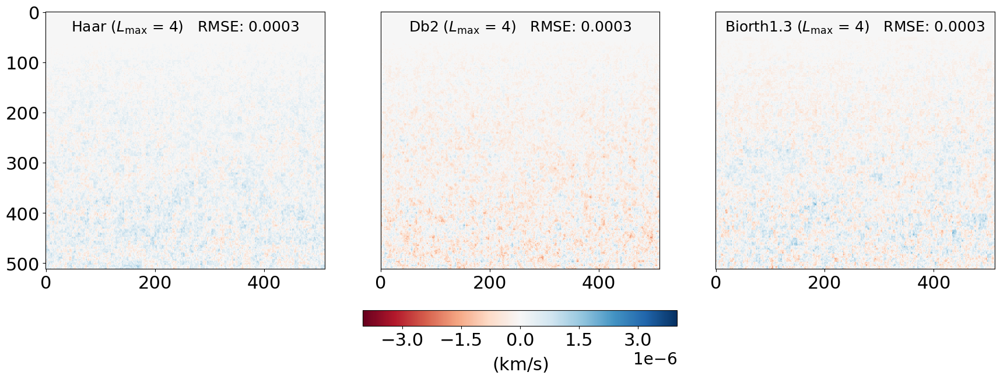

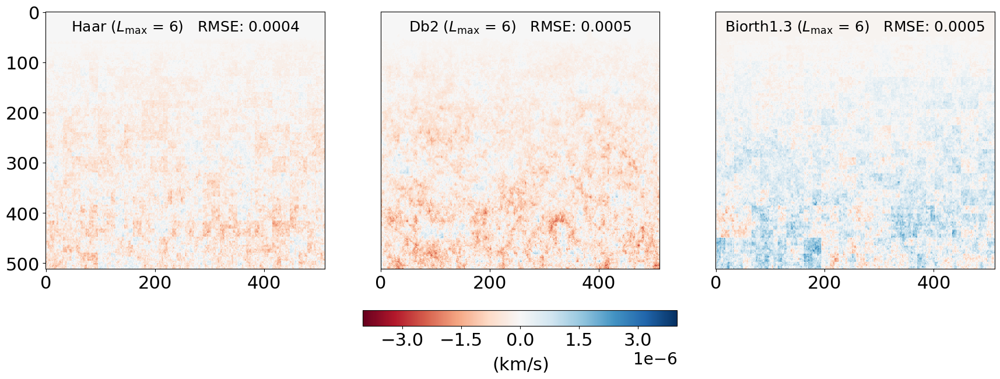

In [97]:
wavelet_type_4plotting = ['haar', 'db2', 'bior1.3']
wavelet_display_names = {
    'haar': 'Haar',
    'db2': 'Db2',
    'bior1.3': 'Biorth1.3'
}
max_levels_4plotting = [4, 6]

for row_idx, max_level in enumerate(max_levels_4plotting):
    fig, axes = plt.subplots(1, 3, figsize=(21, 7), gridspec_kw={'wspace': 0.2})

    for col_idx, wt in enumerate(wavelet_type_4plotting):
        ax = axes[col_idx]
        im = ax.imshow(differences[wt][max_level] / 1000.0, cmap='RdBu',
                       aspect='auto', vmin=-0.004/1000.0, vmax=0.004/1000.0)

        # Ticks setup
        ax.xaxis.set_major_locator(ticker.AutoLocator())
        ax.tick_params(labelsize=22)
        if col_idx == 0:
            ax.yaxis.set_major_locator(ticker.AutoLocator())
        else:
            ax.set_yticks([])

        # Text annotations
        # ax.text(0.9, 0.94, f"{wavelet_display_names[wt]} (Lmax = {max_level})   RMSE: {metrics_maxL_test[wt][max_level]['rmse']:.4f}", fontsize=16, ha='right', va='center', transform=ax.transAxes)
        # ax.text(0.5, 0.94, f"{wavelet_display_names[wt]} (Lmax = {max_level})   RMSE: {metrics_maxL_test[wt][max_level]['rmse']:.4f}", fontsize=16, ha='center', va='center', transform=ax.transAxes)
        ax.text(0.5, 0.94, fr"{wavelet_display_names[wt]} ($L_{{\max}}$ = {max_level})   RMSE: {metrics_maxL_test[wt][max_level]['rmse']:.4f}", fontsize=18, ha='center', va='center', transform=ax.transAxes)

        # ax.text(0.5, 0.94, f"{wavelet_display_names[wt]} (Lmax = {max_level})", fontsize=16, ha='right', va='center', transform=ax.transAxes)

    # Colorbar
    cbar = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', fraction=0.05, pad=0.02)
    cbar.ax.tick_params(labelsize=22)
    cbar.set_label(r"($\mathrm{km/s}$)", fontsize=22, labelpad=8)
    cbar.locator = ticker.MaxNLocator(nbins=6)
    cbar.update_ticks()
    
    # Increase font size of the offset text (e.g., "1e-6")
    cbar.ax.xaxis.offsetText.set_fontsize(20)  # or any desired fontsize

    fig.subplots_adjust(bottom=0.25)
    plt.savefig(f'./plots/BP_Test_Max_LevelDecompositions_diff_IP512x512_3Wavelets_Lmax{max_level}_ImageRec512x512_RMSEcalc_4CWPannMeeting.png', dpi=300, bbox_inches='tight')
    plt.show()


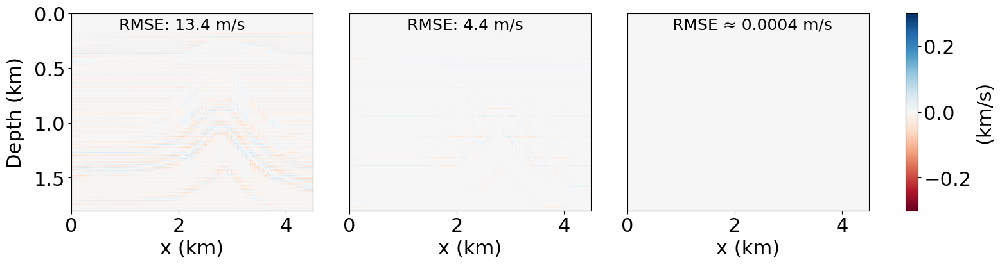

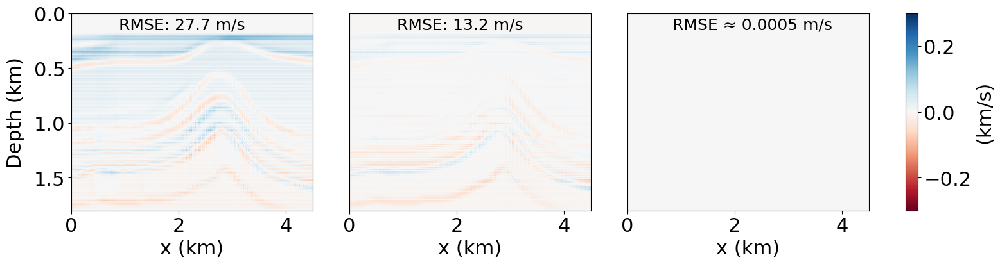

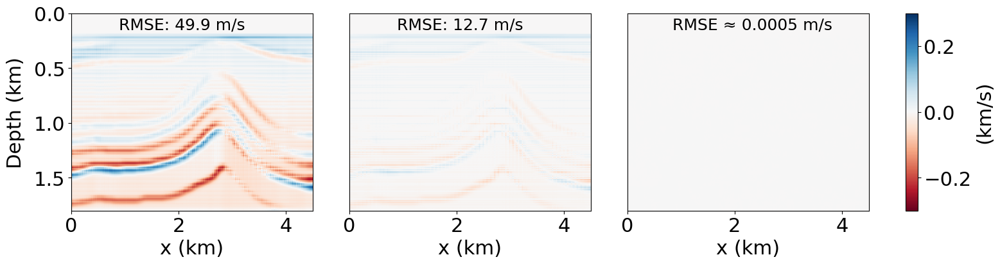

In [23]:
# Dictionary of wavelet names and their corresponding data
wavelet_data_4plotting = {
    'Haar': {
        'data': [
            diff_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450,
            diff_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450,
            diff_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450
        ],
        'titles': ['ImgRec 128x128', 'ImgRec 256x256', 'ImgRec 512x512'],
        'vmax': [0.3, 0.3, 0.3],
        'vmin': [-0.3, -0.3, -0.3],
        'rmse': [rmse_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450,
                 rmse_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450, 
                 rmse_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450],
        'ssim': [ssim_IP512_orig_haar_MaxL6_recImage128x128_downsamp180x450,
                 ssim_IP512_orig_haar_MaxL6_recImage256x256_downsamp180x450, 
                 ssim_IP512_orig_haar_MaxL6_recImage512x512_downsamp180x450]
    },
    'Db2': {
        'data': [
            diff_IP512_orig_db2_MaxL6_recImage130x130_downsamp180x450,
            diff_IP512_orig_db2_MaxL6_recImage258x258_downsamp180x450,
            diff_IP512_orig_db2_MaxL6_recImage512x512_downsamp180x450,
        ],
        'titles': ['ImgRec 512x512', 'ImgRec 258x258', 'ImgRec 130x130'],
        'vmax': [0.3, 0.3, 0.3],
        'vmin': [-0.3, -0.3, -0.3],
        'rmse': [rmse_IP512_orig_db2_MaxL6_recImage130x130_downsamp180x450, 
                rmse_IP512_orig_db2_MaxL6_recImage258x258_downsamp180x450, 
                rmse_IP512_orig_db2_MaxL6_recImage512x512_downsamp180x450],
        'ssim': [ssim_IP512_orig_db2_MaxL6_recImage130x130_downsamp180x450,
                ssim_IP512_orig_db2_MaxL6_recImage258x258_downsamp180x450,
                ssim_IP512_orig_db2_MaxL6_recImage512x512_downsamp180x450]
    },
    'Bior1.3': {
        'data': [
            diff_IP512_orig_bior13_MaxL6_recImage130x130_downsamp180x450,
            diff_IP512_orig_bior13_MaxL6_recImage258x258_downsamp180x450,
            diff_IP512_orig_bior13_MaxL6_recImage512x512_downsamp180x450
        ],
        'titles': ['ImgRec 512x512', 'ImgRec 258x258', 'ImgRec 130x130'],
        'vmax': [0.3, 0.3, 0.3],
        'vmin': [-0.3, -0.3, -0.3],
        'rmse': [rmse_IP512_orig_bior13_MaxL6_recImage130x130_downsamp180x450, 
                rmse_IP512_orig_bior13_MaxL6_recImage258x258_downsamp180x450, 
                rmse_IP512_orig_bior13_MaxL6_recImage512x512_downsamp180x450],
        'ssim': [ssim_IP512_orig_bior13_MaxL6_recImage130x130_downsamp180x450,
                ssim_IP512_orig_bior13_MaxL6_recImage258x258_downsamp180x450,
                ssim_IP512_orig_bior13_MaxL6_recImage512x512_downsamp180x450]
    }
}

extents = [0, 4.5, 1.8, 0]

# Generate alphabetic labels (A, B, C, ...)
labels = list(string.ascii_lowercase)
label_fontsize = 22  # Increased font size for clarity

# Loop through each wavelet
for wavelet, details in wavelet_data_4plotting.items():
    fig = plt.figure(figsize=(17, 4))
    gs = GridSpec(1, 4, width_ratios=[1, 1, 1, 0.05], figure=fig)  # 3 plots + 1 for colorbar

    axes = []
    for i, data in enumerate(details['data']):
        ax = fig.add_subplot(gs[0, i])
        im = ax.imshow(data/1000.0, cmap='RdBu', aspect='auto', vmax=details['vmax'][i], vmin=details['vmin'][i], extent=extents)
        # ax.set_title(details['titles'][i], pad=16, fontsize=18)
        # ax.text(0.5, -0.35, f'({labels[i]})', fontsize=label_fontsize, ha='center', va='center', transform=ax.transAxes)

        # Keep yticks only for the first plot
        if i != 0:
            ax.set_yticks([])

        if i == 0:
            ax.set_ylabel('Depth (km)', fontsize=22, labelpad=10)
        else:
            ax.set_ylabel('')

        ax.set_xlabel('x (km)', fontsize=22)
        ax.tick_params(axis='both', which='major', labelsize=22)  # Change labelsize as needed
        ax.tick_params(axis='both', which='minor', labelsize=22)
        ## write rmse values to figure on the x axis
        if i == 2:
            ax.text(0.85, 0.94, f"RMSE ≈ {details['rmse'][i]:.4f} m/s", fontsize=18, ha='right', va='center', transform=ax.transAxes)
        else:
            ax.text(0.72, 0.94, f"RMSE: {details['rmse'][i]:.1f} m/s", fontsize=18, ha='right', va='center', transform=ax.transAxes)
        # ax.text(0.58, 0.94, f"SSIM: {details['ssim'][i]:.2f}", fontsize=18, ha='left', va='center', transform=ax.transAxes)
        axes.append(ax)

    # Add a single colorbar to the right
    cbar_ax = fig.add_subplot(gs[0, 3])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=22)  # Adjust colorbar tick size if needed
    cbar.set_label('(km/s)', fontsize=22)  # Add colorbar label

    # Add a title for the entire figure
    # plt.suptitle(f'Differences for {wavelet}', fontsize=18, y=1.1)
    # plt.subplots_adjust(hspace=0.3, wspace=0.2)  # Adjust spacing

    # Save the figure
    plt.savefig(f'./plots/BP_Test_diff_orig_and_IP512x512_{wavelet}_MaxL6_recImages_downsamp180x450_RMSEcalc_4CWPannualMeetingPPT_v3.png', dpi=300, bbox_inches='tight')
    plt.show()

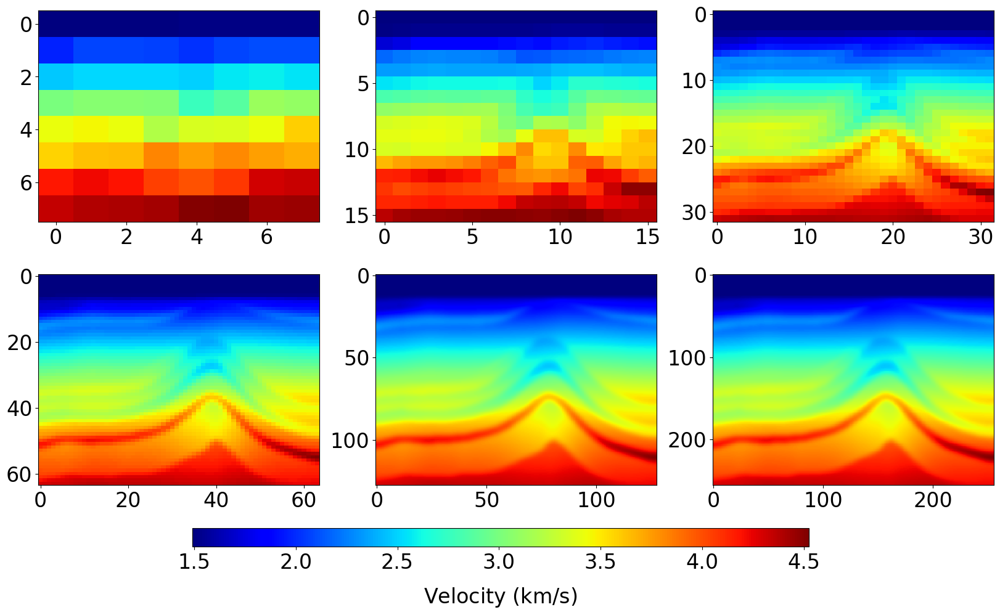

In [38]:
max_level_to_plot = 6
wavelet = 'haar'

# Collect the images for consistent color scaling
all_images = [
    reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    for i in range(max_level_to_plot + 1)
]
vmin2 = min(img.min() for img in all_images)/1000.0
vmax2 = max(img.max() for img in all_images)/1000.0

fig, axes = plt.subplots(2, 3, figsize=(20, 10), gridspec_kw={'hspace': 0.25, 'wspace': 0.2})
fig.subplots_adjust(hspace=0.6, top=0.88)  # Adjust space for better fit

# Generate alphabetic labels (A, B, C, ...)
labels = list(string.ascii_lowercase)
label_fontsize = 22  # Increased font size for clarity

for i in range(0, max_level_to_plot):
    ax = axes.flat[i]
    img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    im1 = ax.imshow(img/1000.0, cmap='jet', aspect='auto', vmin=vmin2, vmax=vmax2)
    # ax.set_title(f'Level {i} - size ({img.shape[0]}, {img.shape[1]})', pad=15, fontsize=18)
    # ax.set_xlabel(f'({labels[i+3]})', fontsize=label_fontsize, labelpad=10)
    ax.tick_params(axis='x', labelsize=24)
    ax.tick_params(axis='y', labelsize=24)


cbar_ax1 = fig.add_axes([0.25, 0.01, 0.5, 0.03])  # [left, bottom, width, height]
cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal')
cbar1.ax.tick_params(labelsize=24)  # Larger tick labels
cbar1.set_label(r"Velocity ($\mathrm{km/s}$)", fontsize=24, labelpad=15)
cbar1.ax.xaxis.set_label_position("bottom")  # Move label below

plt.savefig(f'./plots/BP_Test_Rec_velocity_Haar_with_Lmax6_IP512x512_4CWPannMeeting_withoutTitles.png', dpi=300, bbox_inches='tight')
plt.show()

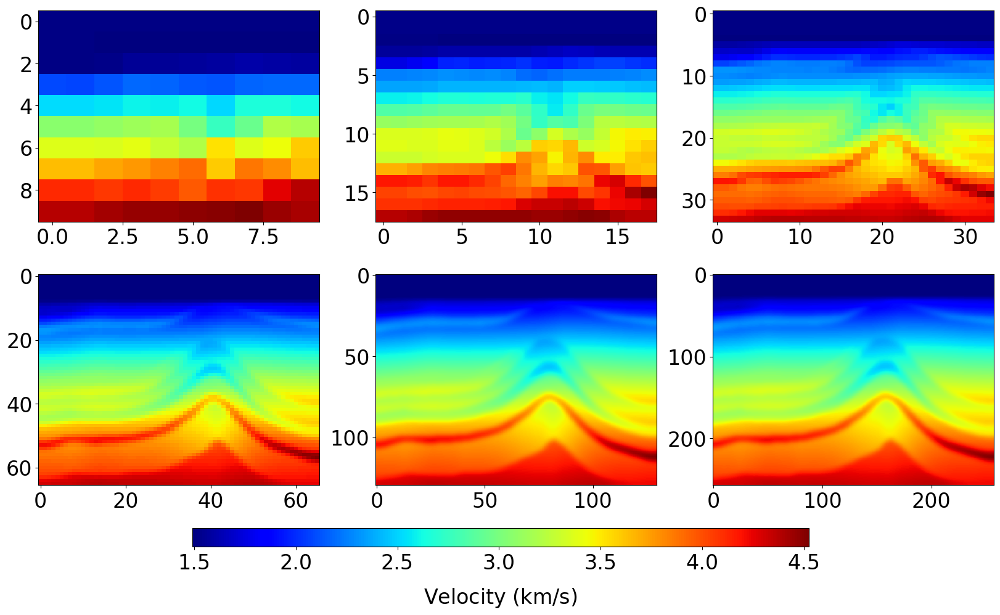

In [39]:
max_level_to_plot = 6
wavelet = 'db2'

# Collect the images for consistent color scaling
all_images = [
    reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    for i in range(max_level_to_plot + 1)
]
vmin2 = min(img.min() for img in all_images)/1000.0
vmax2 = max(img.max() for img in all_images)/1000.0

fig, axes = plt.subplots(2, 3, figsize=(20, 10), gridspec_kw={'hspace': 0.25, 'wspace': 0.2})
fig.subplots_adjust(hspace=0.6, top=0.88)  # Adjust space for better fit

# Generate alphabetic labels (A, B, C, ...)
labels = list(string.ascii_lowercase)
label_fontsize = 22  # Increased font size for clarity

for i in range(0, max_level_to_plot):
    ax = axes.flat[i]
    img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    im1 = ax.imshow(img/1000.0, cmap='jet', aspect='auto', vmin=vmin2, vmax=vmax2)
    # ax.set_title(f'Level {i} - size ({img.shape[0]}, {img.shape[1]})', pad=15, fontsize=18)
    # ax.set_xlabel(f'({labels[i+3]})', fontsize=label_fontsize, labelpad=10)
    ax.tick_params(axis='x', labelsize=24)
    ax.tick_params(axis='y', labelsize=24)


cbar_ax1 = fig.add_axes([0.25, 0.01, 0.5, 0.03])  # [left, bottom, width, height]
cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal')
cbar1.ax.tick_params(labelsize=24)  # Larger tick labels
cbar1.set_label(r"Velocity ($\mathrm{km/s}$)", fontsize=24, labelpad=15)
cbar1.ax.xaxis.set_label_position("bottom")  # Move label below

plt.savefig(f'./plots/BP_Test_Rec_velocity_Db2_with_Lmax6_IP512x512_4CWPannMeeting_withoutTitles.png', dpi=300, bbox_inches='tight')
plt.show()

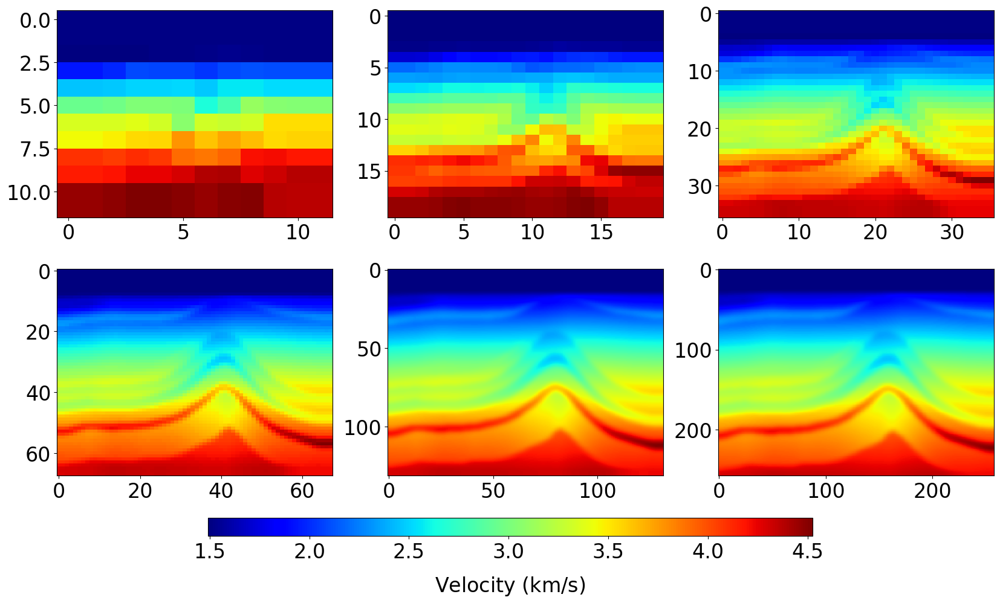

In [26]:
max_level_to_plot = 6
wavelet = 'bior1.3'

# Collect the images for consistent color scaling
all_images = [
    reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    for i in range(max_level_to_plot + 1)
]
vmin2 = min(img.min() for img in all_images)/1000.0
vmax2 = max(img.max() for img in all_images)/1000.0

fig, axes = plt.subplots(2, 3, figsize=(20, 10), gridspec_kw={'hspace': 0.25, 'wspace': 0.2})
fig.subplots_adjust(hspace=0.6, top=0.88)  # Adjust space for better fit

# Generate alphabetic labels (A, B, C, ...)
labels = list(string.ascii_lowercase)
label_fontsize = 22  # Increased font size for clarity

for i in range(0, max_level_to_plot):
    ax = axes.flat[i]
    img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    im1 = ax.imshow(img/1000.0, cmap='jet', aspect='auto', vmin=vmin2, vmax=vmax2)
    # ax.set_title(f'Level {i} - size ({img.shape[0]}, {img.shape[1]})', pad=15, fontsize=18)
    # ax.set_xlabel(f'({labels[i+3]})', fontsize=label_fontsize, labelpad=10)
    ax.tick_params(axis='x', labelsize=24)
    ax.tick_params(axis='y', labelsize=24)


cbar_ax1 = fig.add_axes([0.25, 0.01, 0.5, 0.03])  # [left, bottom, width, height]
cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal')
cbar1.ax.tick_params(labelsize=24)  # Larger tick labels
cbar1.set_label(r"Velocity ($\mathrm{km/s}$)", fontsize=24, labelpad=15)
cbar1.ax.xaxis.set_label_position("bottom")  # Move label below

# plt.savefig(f'./plots/BP_Test_Rec_velocity_bior13_with_Lmax6_IP512x512_4CWPannMeeting_withoutTitles.png', dpi=300, bbox_inches='tight')

plt.show()

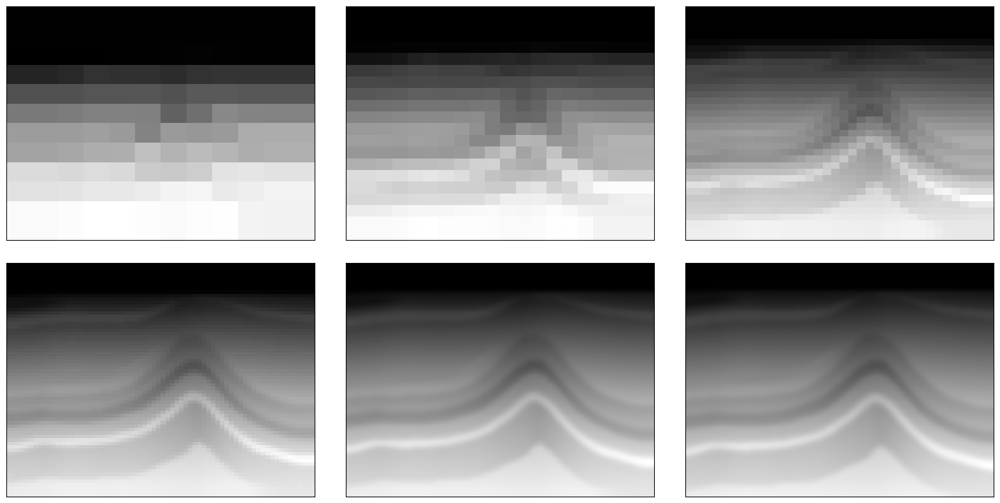

In [28]:
max_level_to_plot = 6
wavelet = 'bior1.3'

# Collect the images for consistent color scaling
all_images = [
    reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    for i in range(max_level_to_plot + 1)
]
vmin2 = min(img.min() for img in all_images)/1000.0
vmax2 = max(img.max() for img in all_images)/1000.0

fig, axes = plt.subplots(2, 3, figsize=(20, 10), gridspec_kw={'hspace': 0.1, 'wspace': 0.1})
fig.subplots_adjust(hspace=0.6, top=0.88)  # Adjust space for better fit

# Generate alphabetic labels (A, B, C, ...)
labels = list(string.ascii_lowercase)
label_fontsize = 22  # Increased font size for clarity

for i in range(0, max_level_to_plot):
    ax = axes.flat[i]
    img = reconstruct_images_IP512[wavelet][max_level_to_plot]['accumulative_levels'][i]
    im1 = ax.imshow(img/1000.0, cmap='grey', aspect='auto', vmin=vmin2, vmax=vmax2)
    # ax.set_title(f'Level {i} - size ({img.shape[0]}, {img.shape[1]})', pad=15, fontsize=18)
    # ax.set_xlabel(f'({labels[i+3]})', fontsize=label_fontsize, labelpad=10)
    # ax.tick_params(axis='x', labelsize=24)
    # ax.tick_params(axis='y', labelsize=24)
    ax.set_xticks([])
    ax.set_yticks([])


# cbar_ax1 = fig.add_axes([0.25, 0.01, 0.5, 0.03])  # [left, bottom, width, height]
# cbar1 = fig.colorbar(im1, cax=cbar_ax1, orientation='horizontal')
# cbar1.ax.tick_params(labelsize=24)  # Larger tick labels
# cbar1.set_label(r"Velocity ($\mathrm{km/s}$)", fontsize=24, labelpad=15)
# cbar1.ax.xaxis.set_label_position("bottom")  # Move label below

plt.savefig(f'./plots/BP_Test_Rec_velocity_bior13_with_Lmax6_IP512x512_4CWPannMeeting_withoutTitles_Gray.png', dpi=300, bbox_inches='tight')
plt.show()